# 02 (sirovi TF-IDF): Reprezentacija i klasterovanje

Radni prostor je sirovi TF-IDF (svi atributi, bez SVD redukcije): skan za izbor k, sloj k=20 (imenovanje + poravnanje), sedam algoritama, hijerarhija mikro-tema, anotirane rečenice i sloj od 223k rečenica; skan se vrti na k iz skena i na k=20 (broj ljudskih klasa).

Napomene: Ward i GMM rade na zgusnutoj matrici (12 234 x ~8 500, float32), GMM samo sa spherical/diag kovarijansom; interni metrici (silueta/DB/CH) se računaju na uzorku od 5 000 redova (seme 42); vizuelizacije idu preko SVD(2)/SVD(50) projekcije samo za oko; BIRCH se ne računa (memorija potklastera).

Pokretanje: prvo cela sveska, pa 02_clustering_parameter_added (dodatak čita keševe iz results/). Csv-ovi imaju ista imena i kolone kao u glavnom prolazu, pa se porede običnim spajanjem.

In [7]:
import os, sys, time, warnings
if os.path.exists("vocabs.txt"):
    ROOT = os.getcwd()
elif os.path.exists("../vocabs.txt"):
    ROOT = os.path.abspath("..")
else:
    raise FileNotFoundError("Nije pronadjen path")
if os.path.exists(os.path.join(ROOT, "raw")):
    raise FileNotFoundError("ovo je sirova sveska, a ROOT je glavni "
                            "folder (sadrži podfolder raw/) — pokreni "
                            "iz raw/")
os.chdir(ROOT)
os.makedirs("csv", exist_ok=True); sys.path.insert(0, ROOT)
print("ROOT =", ROOT)
%matplotlib inline
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from scipy.sparse import issparse
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from scipy.spatial.distance import squareform
from sklearn.cluster import (KMeans, BisectingKMeans,
                             AgglomerativeClustering, Birch, DBSCAN,
                             SpectralClustering)
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import TruncatedSVD, NMF
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import (adjusted_rand_score, silhouette_score,
                             davies_bouldin_score,
                             calinski_harabasz_score)
from sklearn.manifold import TSNE


from sklearn import set_config as _sk_set_config
_sk_set_config(working_memory=256)  # manji baferi parnih rastojanja (RAM)

import nbformat
_p1 = next(p for p in ("notebooks/01_preprocessing.ipynb",
                       "01_preprocessing.ipynb") if os.path.exists(p))
_nb1 = nbformat.read(_p1, as_version=4)
for _c in _nb1.cells:
    if _c.cell_type == "code" and _c.metadata.get("tools"):
        exec(compile(_c.source, "<01_alati>", "exec"), globals())
print("alati iz 01_preprocessing učitani")


ROOT = C:\Users\Trile\PycharmProjects\PythonProject3\important!\raw
alati iz 01_preprocessing učitani


## 1. Metrike klasterovanja


In [4]:
def multilabel_purity(cluster_labels, true_matrix):
    labels = np.asarray(cluster_labels)
    true_matrix = np.asarray(true_matrix)
    total = len(labels)
    if total == 0:
        return 0.0
    correct = 0
    for cid in set(labels.tolist()):
        if cid == -1:
            continue
        idx = np.where(labels == cid)[0]
        counts = true_matrix[idx].sum(axis=0)
        if len(counts):
            dom = int(np.argmax(counts))
            correct += int(true_matrix[idx, dom].sum())
    return correct / total




def internal_metrics(feature_matrix, labels):
    real_clusters = len(set(labels) - {-1})
    coverage = float((np.asarray(labels) != -1).mean())
    if real_clusters < 2:
        return dict(silhouette=np.nan, davies_bouldin=np.nan,
                    calinski=np.nan, n_clusters=real_clusters,
                    coverage=coverage, sil_w=np.nan, db_w=np.nan,
                    ch_w=np.nan)
    keep = np.asarray(labels) != -1
    kept_matrix = feature_matrix[keep]
    kept_labels = np.asarray(labels)[keep]
    rng = np.random.default_rng(42)
    sample = rng.choice(kept_matrix.shape[0],
                        size=min(5000, kept_matrix.shape[0]),
                        replace=False)
    sampled = (np.asarray(kept_matrix[sample].todense(),
                          dtype=np.float32)
               if issparse(kept_matrix) else kept_matrix[sample])
    sil = silhouette_score(sampled, kept_labels[sample],
                           metric="cosine")
    db = davies_bouldin_score(sampled, kept_labels[sample])
    ch = calinski_harabasz_score(sampled, kept_labels[sample])
    return dict(silhouette=sil, davies_bouldin=db, calinski=ch,
                n_clusters=real_clusters, coverage=coverage,
                sil_w=sil * coverage, db_w=db / coverage,
                ch_w=ch * coverage)


## 2. Reprezentacija: sirovi TF-IDF (svi atributi, bez SVD-a)

In [5]:
def build_features(vocab, scan_representation=True):
    docs = (parse_flat_docs("train-data.dat")
            + parse_flat_docs("test-data.dat"))
    Y = np.vstack([
        pd.read_csv("train-label.dat", sep=" ",
                    header=None).values,
        pd.read_csv("test-label.dat", sep=" ",
                    header=None).values])
    texts = [" ".join(vocab.get(w, "?") for w in d) for d in docs]
    vec = TfidfVectorizer(max_df=0.5, min_df=5,
                          stop_words="english", sublinear_tf=True)
    tfidf = vec.fit_transform(texts)
    # sirovi prolaz: radni prostor je TF-IDF kakav jest (svi atributi)
    best_name = "raw TF-IDF (L2)"
    red = tfidf
    chosen_svd = None
    print(f"\nDokumenti (ceo korpus): {tfidf.shape[0]} "
          f"(train 8251 + test 3983); tfidf osobina "
          f"{tfidf.shape[1]}; reprezentacija: {best_name}")
    return dict(tfidf=tfidf, terms=vec.get_feature_names_out(),
                red=red, Y=Y, rep_name=best_name, svd=chosen_svd,
                gmean=np.asarray(tfidf.mean(axis=0)).ravel())

In [8]:
vocab = load_vocab()
F = cached("doc_features_scan.pkl",
           lambda: build_features(vocab, scan_representation=False))
print("radni prostor:", F["rep_name"], "| red:", F["red"].shape)

  [keš] doc_features_scan.pkl učitan (obriši za ponovni račun)
radni prostor: raw TF-IDF (L2) | red: (12234, 8167)


### TF-IDF sloj: gustina i najfrekventniji termovi

In [28]:
tfidf, terms = F["tfidf"], F["terms"]
density = tfidf.nnz / (tfidf.shape[0] * tfidf.shape[1])
print(f"matrica: {tfidf.shape[0]} dokumenata × {tfidf.shape[1]} termova "
      f"(max_df=0.5, min_df=5, sublinear_tf)")
print(f"gustina: {density:.3%} nenultih ćelija (retka matrica — klasterovanje ide direktno preko nje)")
dfreq = np.asarray((tfidf > 0).sum(0)).ravel()
top = np.argsort(dfreq)[::-1][:20]
display(pd.DataFrame({"term": terms[top], "df": dfreq[top],
                      "udeo dokumenata": (dfreq[top] / tfidf.shape[0]).round(3)}))

matrica: 12234 dokumenata × 8167 termova (max_df=0.5, min_df=5, sublinear_tf)
gustina: 0.936% nenultih ćelija (retka matrica — klasterovanje ide direktno preko nje)


,term,df,udeo dokumenata
0,new,4099,0.335
1,work,3807,0.311
2,make,3686,0.301
3,time,3628,0.297
4,document,3239,0.265
5,need,3088,0.252
6,page,3020,0.247
7,com,2946,0.241
8,write,2889,0.236
9,site,2873,0.235


### Pregled u 2D


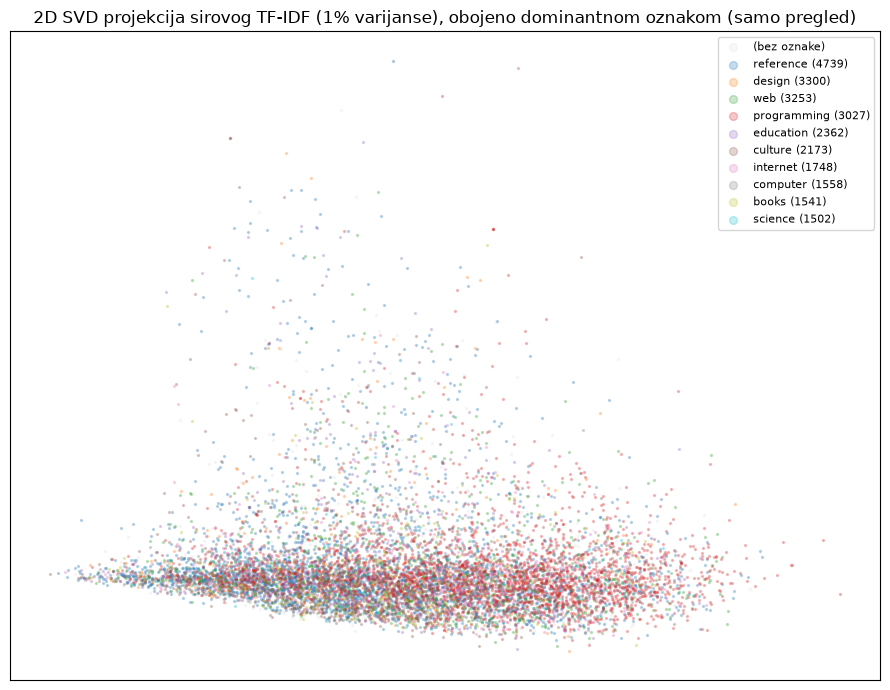

In [29]:
Yd = F["Y"]
dom = np.where(Yd.sum(1) > 0, Yd.argmax(1), -1)
support = Yd.sum(0)
top_classes = np.argsort(support)[::-1][:10]
svd2 = TruncatedSVD(2, random_state=42).fit(F["tfidf"])
viz2 = svd2.transform(F["tfidf"])
fig, ax = plt.subplots(figsize=(9, 7))
mask0 = dom == -1
ax.scatter(viz2[mask0, 0], viz2[mask0, 1], s=2, alpha=.15, color="lightgray", label="(bez oznake)")
for c in top_classes:
    m = dom == c
    ax.scatter(viz2[m, 0], viz2[m, 1], s=2, alpha=.25, label=f"{CLASS_NAMES[c]} ({support[c]})")
var2 = f"{svd2.explained_variance_ratio_.sum():.0%} varijanse"
ax.set_title(f"2D SVD projekcija sirovog TF-IDF ({var2}), obojeno dominantnom oznakom (samo pregled)")
ax.legend(markerscale=4, fontsize=8, loc="best")
ax.set_xticks([]); ax.set_yticks([])
plt.tight_layout()
show_fig("docs_svd2d_preview.png")

## 3. Prirodni broj klastera — interni metrici k=2..20


In [30]:
def sil_scan(F):
    def _compute():
        rows = []
        for k in range(2, 21):
            km = KMeans(k, random_state=42, n_init=3).fit(F["red"])
            m = internal_metrics(F["red"], km.labels_)
            rows.append(dict(k=k, sil=round(m["silhouette"], 4),
                             db=round(m["davies_bouldin"], 3),
                             ch=round(m["calinski"], 1),
                             inertia=round(km.inertia_, 1)))
        df = pd.DataFrame(rows)
        return df
    df = cached("sil_scan.pkl", _compute)
    df.to_csv("csv/sil_inertia_2_20.csv", index=False)
    print("\n--- Interni metrici k=2..20 (korak 1): silueta / "
          "inercija / DB / CH ---")
    print(df.to_string(index=False))
    fig, axes = plt.subplots(2, 2, figsize=(13, 8))
    axes[0, 0].plot(df.k, df.inertia, marker="o")
    axes[0, 0].set_title("Elbow (inertia)")
    axes[0, 1].plot(df.k, df.sil, marker="s", color="orange")
    axes[0, 1].set_title("Silhouette (cosine)")
    axes[0, 1].axvline(4, color="green", ls=":", lw=1.2)
    axes[1, 0].plot(df.k, df.db, marker="^", color="seagreen")
    axes[1, 0].set_title("Davies-Bouldin (lower=better)")
    axes[1, 1].plot(df.k, df.ch, marker="d", color="purple")
    axes[1, 1].set_title("Calinski-Harabasz (higher=better)")
    for ax in axes[1]:
        ax.set_xlabel("k")
    for ax in axes.ravel():
        ax.axvline(3, color="red", ls="--", lw=1, alpha=0.7)
        ax.grid(alpha=0.3)
    fig.suptitle(f"Izbor k (korak 1): četiri interna metrika, "
                 f"konvencija k={K_MAIN}", y=1.01)
    fig.tight_layout(); show_fig("sil_inertia_2_20.png")
    print(f"  silueta argmax k={int(df.loc[df.sil.idxmax(), 'k'])}; "
          f"DB argmin k={int(df.loc[df.db.idxmin(), 'k'])}; "
          f"CH argmax k={int(df.loc[df.ch.idxmax(), 'k'])}")

    return df

  [keš] sil_scan.pkl izračunato i sačuvano

--- Interni metrici k=2..20 (korak 1): silueta / inercija / DB / CH ---
 k     sil     db   ch  inertia
 2  0.0056 12.162 28.1  11766.8
 3  0.0081 10.168 28.1  11702.1
 4  0.0084 11.394 24.5  11664.3
 5  0.0104  9.878 24.5  11608.6
 6  0.0023  8.562 23.7  11561.1
 7 -0.0008  8.537 20.2  11553.9
 8  0.0026  9.369 19.7  11518.9
 9  0.0030  8.727 18.8  11489.8
10  0.0033  8.852 17.6  11472.6
11  0.0043  9.077 16.6  11459.5
12  0.0044  8.864 15.6  11445.3
13  0.0047  8.514 14.9  11430.7
14  0.0055  8.604 14.4  11416.8
15  0.0064  8.784 13.8  11401.5
16  0.0074  8.415 13.5  11388.8
17  0.0071  8.708 12.8  11381.1
18  0.0082  8.537 12.6  11363.8
19  0.0084  8.245 12.3  11352.4
20  0.0088  8.218 11.9  11345.2


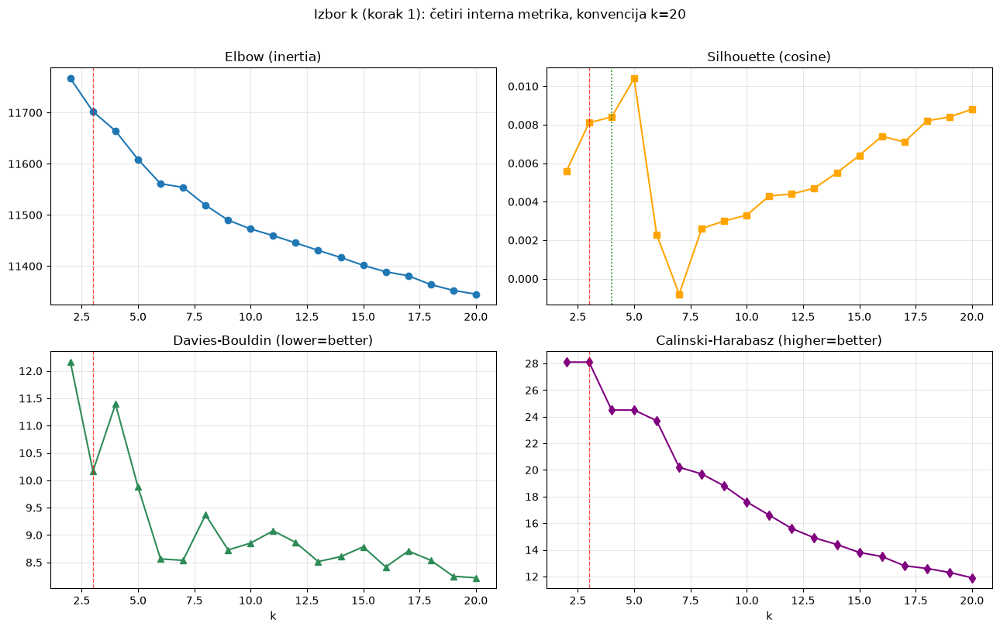

  silueta argmax k=5; DB argmin k=20; CH argmax k=2


In [31]:
sil_df = sil_scan(F)

### Pun K-Means skan k=2..120

In [32]:
def kscan_full(F):
    print("  [kscan] pun K-Means skan k=2..120 (spor deo) ...")
    def _compute():
        rows = []
        for k in range(2, 121):
            km = KMeans(k, random_state=42, n_init=3).fit(F["red"])
            m = internal_metrics(F["red"], km.labels_)
            rows.append(dict(k=k, silhouette=round(m["silhouette"], 4),
                             db=round(m["davies_bouldin"], 3),
                             ch=round(m["calinski"], 1),
                             inertia=round(km.inertia_, 1)))
            if k % 10 == 0 or k in (2, 3, 4, 5):
                print(f"    kscan k={k:>3}: sil {m['silhouette']:.4f} "
                      f"ch {m['calinski']:.1f}")
        full = pd.DataFrame(rows)
        return full
    full = cached("kscan_full.pkl", _compute)
    full.to_csv("csv/kscan_2_120.csv", index=False)
    best = full.loc[full.silhouette.idxmax()]
    best_ch = full.loc[full.ch.idxmax()]
    best_db = full.loc[full.db.idxmin()]
    fig, axes = plt.subplots(2, 2, figsize=(13, 8))
    axes[0, 0].plot(full.k, full.inertia, marker=".", ms=3, color="steelblue")
    axes[0, 0].set_title("Inercija (lakat)")
    axes[0, 1].plot(full.k, full.silhouette, marker=".", ms=3, color="orange")
    axes[0, 1].axvline(int(best.k), color="green", ls=":", lw=1.5,
                       label=f"argmax k={int(best.k)}")
    axes[0, 1].axvline(3, color="red", ls="--", lw=1, alpha=0.8, label="k=3")
    axes[0, 1].set_title("Silueta (kosinus)"); axes[0, 1].legend()
    axes[1, 0].plot(full.k, full.db, marker=".", ms=3, color="seagreen")
    axes[1, 0].set_title("Davies-Bouldin (niže = bolje)")
    axes[1, 1].plot(full.k, full.ch, marker=".", ms=3, color="purple")
    axes[1, 1].axvline(int(best_ch.k), color="green", ls=":", lw=1.5,
                       label=f"argmax k={int(best_ch.k)}")
    axes[1, 1].set_title("Calinski-Harabasz (više = bolje)")
    axes[1, 1].legend()
    for ax in axes[1]:
        ax.set_xlabel("k")
    for ax in axes.ravel():
        ax.grid(alpha=.3)
    fig.suptitle("Pun K-Means skan k=2..120: sva četiri interna metrika")
    fig.tight_layout(); show_fig("kscan_2_120.png")
    print(f"  [kscan] argmax siluete na 2..120: k={int(best.k)} "
          f"({best.silhouette:.4f}); DB argmin k={int(best_db.k)}; "
          f"CH argmax k={int(best_ch.k)} ({best_ch.ch:.1f})")
    return full

  [kscan] pun K-Means skan k=2..120 (spor deo) ...
    kscan k=  2: sil 0.0056 ch 28.1
    kscan k=  3: sil 0.0081 ch 28.1
    kscan k=  4: sil 0.0084 ch 24.5
    kscan k=  5: sil 0.0104 ch 24.5
    kscan k= 10: sil 0.0033 ch 17.6
    kscan k= 20: sil 0.0088 ch 11.9
    kscan k= 30: sil 0.0118 ch 9.3
    kscan k= 40: sil 0.0113 ch 7.9
    kscan k= 50: sil 0.0126 ch 6.9
    kscan k= 60: sil 0.0151 ch 6.1
    kscan k= 70: sil 0.0150 ch 5.6
    kscan k= 80: sil 0.0116 ch 5.1
    kscan k= 90: sil 0.0161 ch 4.9
    kscan k=100: sil 0.0174 ch 4.6
    kscan k=110: sil 0.0178 ch 4.4
    kscan k=120: sil 0.0173 ch 4.1
  [keš] kscan_full.pkl izračunato i sačuvano


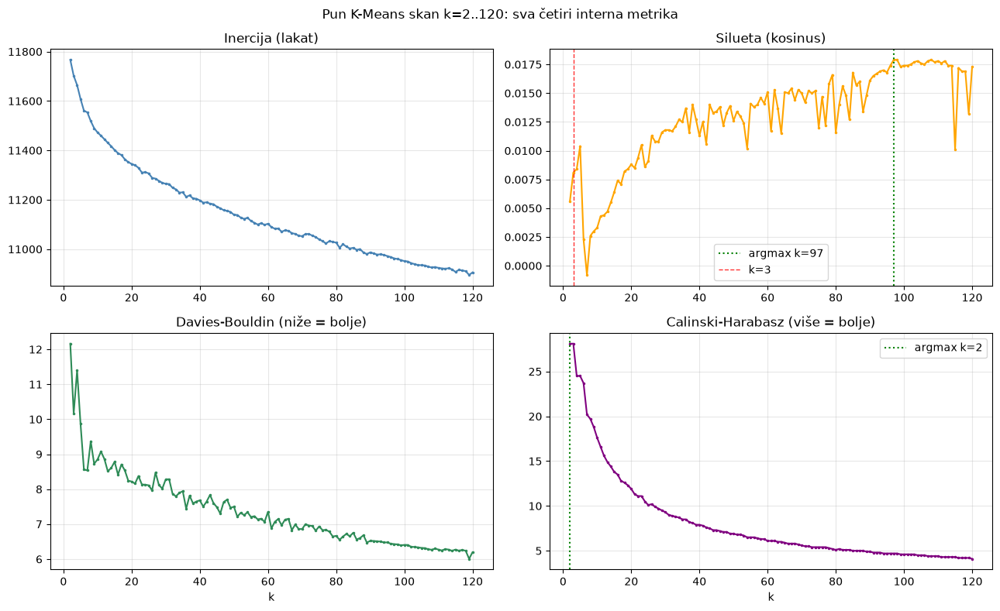

  [kscan] argmax siluete na 2..120: k=97 (0.0179); DB argmin k=119; CH argmax k=2 (28.1)


In [33]:
kscan_df = kscan_full(F)

### Lestvica stabilnosti po semena

In [34]:
def seed_ladder(F, ks=(3, 4, 5, 8, 12, 20, 40, 62, 72)):
    def _compute():
        rows = []
        print("\n--- Lestvica stabilnosti po semena (K-Means, puni "
              f"podaci, semena {SEEDS}) ---")
        for k in ks:
            parts = [KMeans(k, random_state=s, n_init=10)
                     .fit_predict(F["red"]) for s in SEEDS]
            ari = (adjusted_rand_score(parts[0], parts[1])
                   + adjusted_rand_score(parts[0], parts[2])) / 2
            rows.append(dict(k=k, seed_ari=round(float(ari), 3)))
            print(f"  k={k:>2}: {ari:.3f}")
        df = pd.DataFrame(rows)
        return df
    df = cached("seed_ladder.pkl", _compute)
    df.to_csv("csv/stability_ladder.csv", index=False)
    fig, ax = plt.subplots(figsize=(8, 4.5))
    ax.bar([str(k) for k in df.k], df.seed_ari, color="steelblue")
    ax.axhline(0.9, color="red", ls="--", lw=1, alpha=0.7)
    ax.set_xlabel("k"); ax.set_ylabel("seed ARI")
    ax.set_title("Lestvica stabilnosti po semena (puni podaci); "
                 "isprekidana linija = prag 0.9")
    ax.grid(alpha=0.3, axis="y")
    fig.tight_layout(); show_fig("stability_ladder.png")

    return df


--- Lestvica stabilnosti po semena (K-Means, puni podaci, semena (42, 7, 2026)) ---
  k= 3: 0.969
  k= 4: 0.423
  k= 5: 0.765
  k= 8: 0.897
  k=12: 0.534
  k=20: 0.474
  k=40: 0.348
  k=62: 0.297
  k=72: 0.302
  [keš] seed_ladder.pkl izračunato i sačuvano


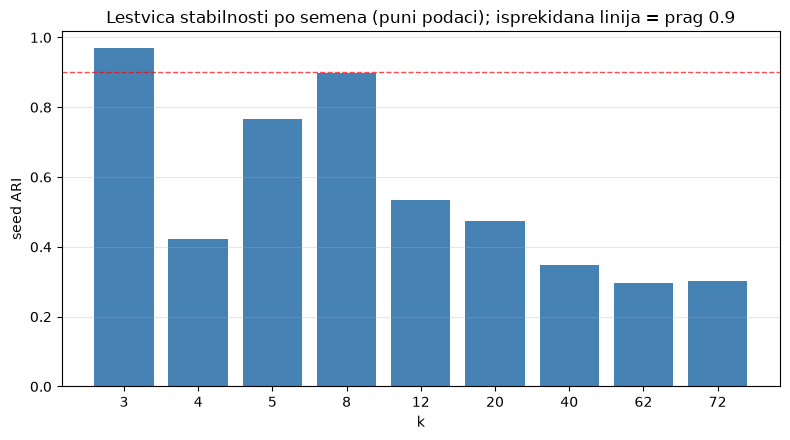

In [35]:
ladder_df = seed_ladder(F)

## 4. Sloj k=20 — imenovanje, top reči i poravnanje


In [9]:
def discriminative_words(tfidf, terms, idx, corpus_mean, n=8):
    if len(idx) == 0:
        return []
    cluster_mean = np.asarray(tfidf[idx].mean(axis=0)).ravel()
    return [terms[i] for i in
            np.argsort(cluster_mean - corpus_mean)[::-1][:n]]



def _class_lift(Y, mask, min_count=3, min_lift=1.0):
    subset = Y[mask]
    if subset.shape[0] == 0:
        return np.full(Y.shape[1], -np.inf)
    counts = subset.sum(0)
    base = np.maximum(Y.mean(0), 1e-12)
    lift = (counts / subset.shape[0]) / base
    keep = (counts >= min_count) & (lift >= min_lift)
    return np.where(keep, lift, -np.inf)



def _safe_filename(name):
    return (name.lower().replace(" ", "_").replace("(", "")
            .replace(")", "").replace("/", "_"))



def _dominant_class(Y, mask, min_count=3):
    lift = _class_lift(Y, mask, min_count=min_count)
    di = int(np.argmax(lift))
    return di if np.isfinite(lift[di]) else -1


In [10]:
def k20_alignment(F, level="documents", tag=None):
    tag = tag or _safe_filename(level)
    labels = cached(f"k20_{tag}.pkl",
                    lambda: KMeans(K_MAIN, random_state=42,
                                   n_init=10).fit(F["red"]).labels_)
    capture = multilabel_purity(labels, F["Y"])
    print(f"\n--- k={K_MAIN} imenovanje liftom, {level} "
          f"(capture {capture:.3f}) ---")
    rows = []
    for c in np.argsort(-np.bincount(labels)):
        idx = np.where(labels == c)[0]
        if not len(idx):
            continue
        lift_c = _class_lift(F["Y"], labels == c)
        di = int(np.argmax(lift_c))
        has = np.isfinite(lift_c[di])
        dom = CLASS_NAMES[di] if has else "(mixed)"
        words = ", ".join(discriminative_words(
            F["tfidf"], F["terms"], idx, F["gmean"], n=5))
        lv = f"{lift_c[di]:.1f}" if has else "-"
        rows.append(dict(cluster=c, n_docs=len(idx), dominant=dom,
                         lift=lv, words=words))
        print(f"  cl{c:>2} ({len(idx):>4}) [{dom}x{lv}]: {words}")
    pd.DataFrame(rows).to_csv(f"csv/{tag}_k20_cluster_words.csv",
                              index=False)
    return labels


In [11]:
def centroid_top_words(F, labels, n=8):
    terms = np.array(F["terms"])
    print(f"\n--- Top reči po klasteru (centroidi direktno iz "
          f"TF-IDF, top {n}) ---")
    for c in sorted(set(labels) - {-1}):
        center = np.asarray(
            F["tfidf"][labels == c].mean(axis=0)).ravel()
        top = center.argsort()[::-1][:n]
        print(f"  cl{c:>2}: {', '.join(terms[i] for i in top)}")

In [12]:
def k20_class_heatmap(F, labels, level="documents",
                      tag=None, k_title=None, fname=None,
                      top_clusters=None):
    tag = tag or _safe_filename(level)
    clusters = sorted(set(labels) - {-1})
    if top_clusters is not None:
        sizes = {c: int((np.asarray(labels) == c).sum())
                 for c in clusters}
        clusters = sorted(sizes, key=lambda c: -sizes[c])[:top_clusters]
    ctab = np.zeros((len(clusters), N_CLASSES))
    row_of = {c: i for i, c in enumerate(clusters)}
    for c in clusters:
        idx = np.where(np.asarray(labels) == c)[0]
        if len(idx):
            ctab[row_of[c]] = (F["Y"][idx].sum(0)
                               / max(1, F["Y"][idx].sum()))
    fig, ax = plt.subplots(figsize=(11, 7))
    im = ax.imshow(ctab, aspect="auto", cmap="magma")
    ax.set_xticks(range(N_CLASSES))
    ax.set_xticklabels(CLASS_NAMES, rotation=90, fontsize=8)
    ax.set_yticks(range(ctab.shape[0]))
    ax.set_yticklabels([f"cl{c} (n={int((np.asarray(labels) == c).sum())})"
                        for c in clusters], fontsize=7)
    ax.set_title(f"Udeo klasa po klasteru ({level}, "
                 f"k={k_title or K_MAIN})")
    plt.colorbar(im, ax=ax, fraction=0.025)
    for i in range(ctab.shape[0]):
        for j in range(N_CLASSES):
            value = ctab[i, j]
            ax.text(j, i, f"{value:.2f}", ha="center",
                    va="center", fontsize=5.5,
                    color="white" if value > 0.5 else "black")
    fig.tight_layout()
    show_fig(fname or f"{tag}_k20_cluster_class_heatmap.png")


In [13]:
def per_class_alignment(labels, Y, level="documents",
                        tag=None):
    tag = tag or _safe_filename(level)
    dominant_of = {c: int(np.argmax(_class_lift(Y, labels == c)))
                   for c in set(labels)}
    pred = np.array([dominant_of[label] for label in labels])
    arows = []
    for c in range(N_CLASSES):
        t = Y[:, c].astype(bool)
        p = pred == c
        tp = int((t & p).sum())
        arows.append(dict(class_name=CLASS_NAMES[c],
                          support=int(t.sum()),
                          capture=tp / max(1, int(t.sum())),
                          precision=tp / max(1, int(p.sum()))))
    df = pd.DataFrame(arows).sort_values("capture", ascending=False)
    df.to_csv(f"csv/{tag}_k20_per_class_alignment.csv",
              index=False)
    print(f"\n--- Poravnanje po klasama, {level} ---")
    print(df.round(3).to_string(index=False))
    zero = df[df.capture == 0].class_name.tolist()
    print("  zero-capture: " + (", ".join(zero) or "(none)"))
    return df


  [keš] k20_documents.pkl učitan (obriši za ponovni račun)

--- k=20 imenovanje liftom, documents (capture 0.507) ---
  cl 4 (2148) [sciencex1.4]: copyright, game, reserv, width, noncommerci
  cl 1 (1151) [religionx5.1]: god, polit, human, world, american
  cl19 (1077) [stylex3.6]: post, comment, love, june, look
  cl17 ( 998) [philosophyx2.2]: peopl, think, thing, don, know
  cl12 ( 874) [internetx2.2]: privaci, polici, site, search, term
  cl 3 ( 791) [programmingx2.4]: program, comput, applic, softwar, develop
  cl10 ( 730) [stylex3.0]: style, imag, browser, font, page
  cl15 ( 645) [computerx2.4]: file, instal, server, window, run
  cl14 ( 609) [javax4.8]: object, class, method, code, java
  cl11 ( 590) [booksx5.0]: book, publish, author, print, chapter
  cl16 ( 588) [javax4.5]: releas, version, download, project, sourc
  cl 8 ( 404) [educationx4.3]: student, teacher, learn, educ, teach
  cl 6 ( 375) [grammarx9.0]: word, english, dictionari, languag, translat
  cl13 ( 374) [stylex1

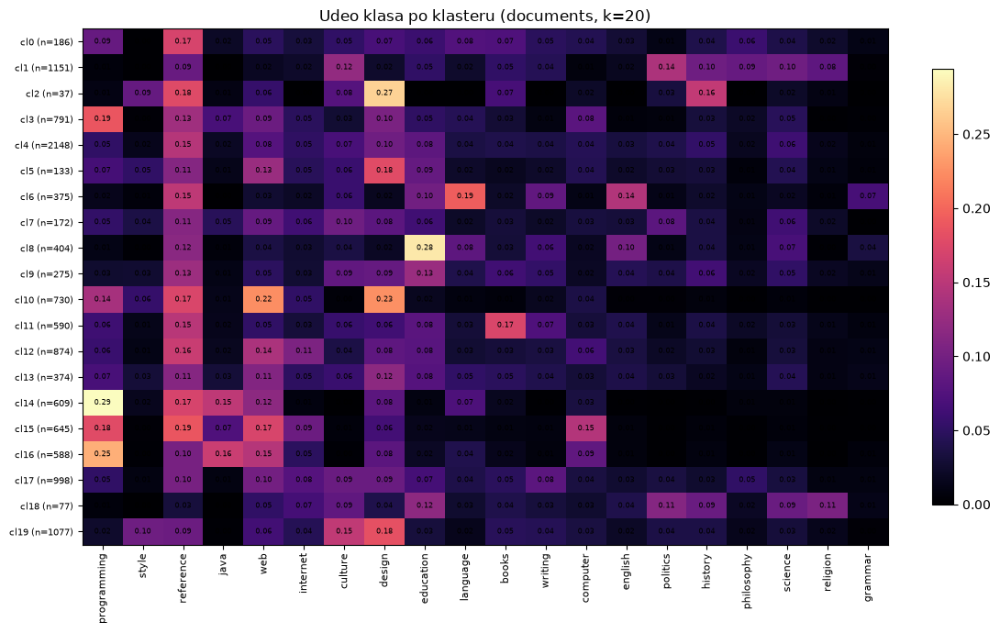


--- Poravnanje po klasama, documents ---
 class_name  support  capture  precision
      style      707    0.576      0.173
   religion      618    0.510      0.257
       java     1171    0.457      0.447
    grammar      357    0.277      0.264
    science     1502    0.252      0.176
      books     1541    0.243      0.636
 philosophy      867    0.220      0.161
  education     2362    0.186      0.647
   internet     1748    0.158      0.316
programming     3027    0.157      0.602
   computer     1558    0.129      0.312
   politics     1222    0.030      0.215
  reference     4739    0.000      0.000
    writing     1417    0.000      0.000
    culture     2173    0.000      0.000
     design     3300    0.000      0.000
        web     3253    0.000      0.000
   language     1487    0.000      0.000
    history     1339    0.000      0.000
    english     1080    0.000      0.000
  zero-capture: reference, writing, culture, design, web, language, history, english


,class_name,support,capture,precision
1,style,707,0.575672,0.173118
18,religion,618,0.509709,0.256515
3,java,1171,0.456874,0.446951
19,grammar,357,0.277311,0.264000
17,science,1502,0.251664,0.175978
10,books,1541,0.243348,0.635593
16,philosophy,867,0.220300,0.161318
8,education,2362,0.185859,0.646539
5,internet,1748,0.157895,0.315789
0,programming,3027,0.157251,0.601770


In [30]:
doc_labels = k20_alignment(F)
centroid_top_words(F, doc_labels)
k20_class_heatmap(F, doc_labels)
per_class_alignment(doc_labels, F["Y"])

## 5. Poređenje algoritama — svih osam


In [14]:
def cluster_scatter(emb, labels, info, filename, title, min_pts=15,
                    max_labels=25, topn=12):
    fig, ax = plt.subplots(figsize=(11.5, 7))
    margin = 0.30
    x_lo, x_hi = emb[:, 0].min(), emb[:, 0].max()
    y_lo, y_hi = emb[:, 1].min(), emb[:, 1].max()
    pad_y = 0.03 * (y_hi - y_lo)
    x_total = x_hi - x_lo
    x_lim = x_lo + (1.0 + margin) * x_total
    sizes = {c: int((labels == c).sum())
             for c in set(labels) if c != -1}
    if len(sizes) <= 20:
        sc = ax.scatter(emb[:, 0], emb[:, 1], c=labels, cmap="tab20",
                        s=10, alpha=0.5)
        ax.set_xlim(x_lo - 0.02 * x_total, x_lim)
        ax.set_ylim(y_lo - pad_y, y_hi + pad_y)
        cand = [c for c in sorted(sizes, key=lambda c: -sizes[c])
                [:max_labels] if sizes[c] >= min_pts]
        if cand:
            ys = np.linspace(y_hi, y_lo, len(cand))
            x_lab = x_hi + 0.045 * x_total
            x_stem = x_hi + 0.012 * x_total
            for c, ly in zip(cand, ys):
                m = labels == c
                cx, cy = emb[m, 0].mean(), emb[m, 1].mean()
                text, _ = info.get(c, (str(c), 0))
                col = sc.cmap(sc.norm(c))
                ax.annotate("", xy=(x_stem, ly), xytext=(cx, cy),
                            arrowprops=dict(arrowstyle="-", lw=0.6,
                                            color=col, alpha=0.5,
                                            shrinkA=1, shrinkB=1))
                ax.text(x_lab, ly, text, fontsize=6.5, ha="left",
                        va="center", weight="bold", color=col,
                        bbox=dict(boxstyle="round", fc="white", ec=col,
                                  alpha=0.9))
        fig.colorbar(sc, ax=ax, fraction=0.046, pad=0.02
                     ).set_label("cluster id")
    else:
        top = sorted(sizes, key=lambda c: -sizes[c])[:topn]
        ax.scatter(emb[:, 0], emb[:, 1], s=5, alpha=0.30,
                   color="0.78", edgecolors="none", zorder=1)
        cmap = plt.get_cmap("tab20")
        colors = {c: cmap(i % 20) for i, c in enumerate(top)}
        for c in top:
            m = labels == c
            ax.scatter(emb[m, 0], emb[m, 1], s=7, alpha=0.55,
                       color=colors[c], edgecolors="none", zorder=2)
        ys = np.linspace(y_hi, y_lo, len(top))
        x_lab = x_hi + 0.05 * x_total
        x_stem = x_hi + 0.012 * x_total
        for c, ly in zip(top, ys):
            m = labels == c
            cx, cy = emb[m, 0].mean(), emb[m, 1].mean()
            ax.scatter([cx], [cy], marker="x", s=70, linewidths=1.8,
                       color=colors[c], zorder=4)
            ax.annotate("", xy=(x_stem, ly), xytext=(cx, cy),
                        arrowprops=dict(arrowstyle="-", lw=0.6,
                                        color=colors[c], alpha=0.5,
                                        shrinkA=2, shrinkB=2))
            text, _ = info.get(c, (str(c), 0))
            ax.text(x_lab, ly, text, fontsize=6.8, ha="left",
                    va="center", weight="bold", color=colors[c],
                    bbox=dict(boxstyle="round", fc="white",
                              ec=colors[c], alpha=0.9))
        cov = sum(sizes[c] for c in top) / len(labels)
        ax.text(0.99, 0.01,
                f"obojeno: {topn} najvećih od {len(sizes)} klastera "
                f"({cov:.0%}); ostali sivo",
                transform=ax.transAxes, ha="right", va="bottom",
                fontsize=8, color="0.35")
        ax.set_xlim(x_lo - 0.02 * x_total, x_lim)
        ax.set_ylim(y_lo - pad_y, y_hi + pad_y)
    ax.set_title(title); ax.set_xticks([]); ax.set_yticks([])
    fig.tight_layout(); show_fig(filename)


In [15]:
def label_stamps(F, labels, n_words=2, stamp_lift=2.0):
    out = {}
    Y = F["Y"]
    for c in set(labels):
        if c == -1:
            continue
        idx = np.where(labels == c)[0]
        if not len(idx):
            continue
        lift_c = _class_lift(Y, labels == c)
        di = int(np.argmax(lift_c))
        has_dom = np.isfinite(lift_c[di]) and lift_c[di] >= stamp_lift
        words = discriminative_words(F["tfidf"], F["terms"], idx,
                                     F["gmean"], n=n_words)
        if has_dom:
            idx_in = idx[Y[idx, di] == 1]
            idx_out = idx[Y[idx, di] == 0]
            if len(idx_in) >= 3 and len(idx_out) >= 3:
                mean_in = np.asarray(
                    F["tfidf"][idx_in].mean(axis=0)).ravel()
                mean_out = np.asarray(
                    F["tfidf"][idx_out].mean(axis=0)).ravel()
                words = [F["terms"][i] for i in
                         np.argsort(mean_in - mean_out)[::-1][:n_words]]
            out[c] = (f"{CLASS_NAMES[di]} ×{lift_c[di]:.1f}\n{'/'.join(words)}", di)
        else:
            order = np.argsort(lift_c)[::-1]
            parts = [f"{CLASS_NAMES[j]}({lift_c[j]:.1f})"
                     for j in order[:2] if np.isfinite(lift_c[j])]
            name = " ".join(parts) if parts else "(mixed)"
            out[c] = (f"{name}\n{'/'.join(words)}", -1)
    return out


In [16]:
def per_algorithm_scatter(F, labels_of, emb, emb_svd2, level="documents"):
    tag = _safe_filename(level)
    var2 = (f"{F['svd'].explained_variance_ratio_[:2].sum():.0%} varijanse"
            if F.get("svd") is not None else "komponente 1-2")
    for name, lab in labels_of.items():
        info = label_stamps(F, lab)
        safe = _safe_filename(name)
        cluster_scatter(
            emb_svd2, lab, info,
            f"{tag}_svd2d_{safe}.png",
            f"{level} - {name}\n2D SVD projekcija ({var2})")
        cluster_scatter(
            emb, lab, info, f"{tag}_tsne_{safe}.png",
            f"{level} - {name} (t-SNE)")


In [18]:
def select_gmm_covariance(red, k):
    best_cov, best_bic = None, np.inf
    rows = []
    for cov in ("spherical", "diag"):
        bic = GaussianMixture(k, covariance_type=cov,
                              random_state=42).fit(red).bic(red)
        rows.append(dict(covariance=cov, BIC=round(float(bic), 1)))
        print(f"    [gmm-bic] covariance={cov:<9} BIC={bic:.0f}")
        if bic < best_bic:
            best_cov, best_bic = cov, bic
    print(f"    [gmm-bic] -> izabrana covariance_type={best_cov}")
    return best_cov, rows


In [19]:
def select_dbscan_eps(red, min_samples=10):
    best_eps, best_clusters = None, -1
    rows = []
    for eps_value in (0.6, 0.7, 0.75, 0.8, 0.85, 0.9, 0.95, 1.0, 1.1):
        db = DBSCAN(eps=eps_value,
                    min_samples=min_samples).fit(red)
        n_clusters = len(set(db.labels_) - {-1})
        coverage = float((db.labels_ != -1).mean())
        print(f"    [eps-pretraga] eps={eps_value}: "
              f"klastera={n_clusters}, pokrivenost={coverage:.2f}")
        rows.append(dict(eps=eps_value, n_clusters=n_clusters,
                         coverage=round(coverage, 3)))
        if coverage >= 0.5 and n_clusters > best_clusters:
            best_eps, best_clusters = eps_value, n_clusters
    if best_eps is None:
        best_eps = 1.1
    final = DBSCAN(eps=best_eps, min_samples=min_samples).fit(red)
    sizes = np.sort(np.bincount(final.labels_[final.labels_ >= 0]))[::-1]
    print(f"    [eps-pretraga] -> izabrano eps={best_eps}: "
          f"veličine klastera {sizes.tolist()[:6]}, "
          f"šuma {int((final.labels_ == -1).sum())}")
    from sklearn.neighbors import NearestNeighbors
    nn = NearestNeighbors(n_neighbors=min_samples).fit(red)
    d, _ = nn.kneighbors(red)
    fig, ax = plt.subplots(figsize=(9, 5))
    ax.plot(np.sort(d[:, -1]), color="steelblue")
    ax.set_xlabel("tačke (sortirane po rastojanju)")
    ax.set_ylabel(f"rastojanje do {min_samples}. najbližeg suseda")
    ax.set_title("k-distance: bez oštrog lakta => ne postoji prirodna "
                 "gustinska granica (eps je trade-off, ne izbor)")
    ax.grid(alpha=.3)
    fig.tight_layout(); show_fig("dbscan_kdistance.png")
    return best_eps, rows


In [20]:
def select_birch_threshold(red, k):
    rows = []
    for threshold_value in (0.1, 0.2, 0.3, 0.5, 1.0):
        birch_labels = Birch(n_clusters=k,
                             threshold=threshold_value
                             ).fit_predict(red)
        m = internal_metrics(red, birch_labels)
        balance = (np.bincount(birch_labels).min()
                   / np.bincount(birch_labels).max())
        rows.append((threshold_value, m["silhouette"], balance))
        print(f"    [birch-prag] threshold={threshold_value}: "
              f"silueta={m['silhouette']:.3f}, "
              f"balans={balance:.2f}")
    pd.DataFrame(rows, columns=["threshold", "silhouette", "balance"]) \
        .to_csv("csv/birch_threshold_scan.csv", index=False)
    ok = [r for r in rows if r[1] >= 0.5 * max(s for _, s, _ in rows)]
    best_th = max(ok, key=lambda r: r[2])[0] if ok else 0.5
    print(f"    [birch-prag] -> izabran threshold={best_th}")
    return best_th, rows


In [21]:
import gc


def algorithm_table(F, level="documents",
                    csv_name="algorithm_table.csv"):
    red = F["red"]
    Y = F["Y"]

    red_dense = (np.asarray(red.todense(), dtype=np.float32)
                 if issparse(red) else red)
    best_cov, gmm_rows = cached(
        "sel_gmm_cov.pkl",
        lambda: select_gmm_covariance(red_dense, K_MAIN))
    best_eps, dbscan_rows = cached(
        "sel_dbscan_eps.pkl",
        lambda: select_dbscan_eps(red))
    # BIRCH se ne računa u sirovom prolazu (memorija potklastera).
    best_th, birch_rows = None, []

    def _fits():
        results, labels_of = [], {}

        def record(name, labels):
            m = internal_metrics(red, labels)
            results.append(dict(algorithm=name,
                                purity=multilabel_purity(labels, Y), **m))
            labels_of[name] = np.asarray(labels)

        km = KMeans(K_MAIN, random_state=42, n_init=10).fit(red)
        record("K-Means", km.labels_)
        bkm = BisectingKMeans(K_MAIN, random_state=42).fit(red)
        record("Bisecting K-Means", bkm.labels_)
        gmm = GaussianMixture(K_MAIN, covariance_type=best_cov,
                              random_state=42).fit(red_dense)
        record("GMM", gmm.predict(red_dense))
        agg = AgglomerativeClustering(K_MAIN, linkage="ward") \
            .fit(red_dense)
        record("Agglomerative (ward)", agg.labels_)
        del agg; gc.collect()
        nmf = NMF(K_MAIN, random_state=42, init="nndsvda",
                  max_iter=500).fit(F["tfidf"])
        record("NMF", nmf.transform(F["tfidf"]).argmax(1))
        db = DBSCAN(eps=best_eps, min_samples=10).fit(red)
        record("DBSCAN", db.labels_)
        spec = SpectralClustering(K_MAIN, affinity="nearest_neighbors",
                                  n_neighbors=30, random_state=42,
                                  n_jobs=-1).fit(red)
        record("Spectral (k-NN)", spec.labels_)
        del spec; gc.collect()
        gc.collect()
        return dict(results=results, labels_of=labels_of)

    d = cached("algorithm_table.pkl", _fits)
    results, labels_of = d["results"], d["labels_of"]

    print(f"\n--- Ne-k parametri ({level}): skan i izbor ---")
    gmm_df = pd.DataFrame(gmm_rows)
    gmm_df.to_csv("csv/gmm_covariance_scan.csv", index=False)
    print("GMM, covariance_type (BIC, manje = bolje):")
    print(gmm_df.to_string(index=False))
    dbscan_df = pd.DataFrame(dbscan_rows)
    dbscan_df.to_csv("csv/dbscan_eps_scan.csv", index=False)
    print("DBSCAN, eps (klasteri / pokrivenost):")
    print(dbscan_df.to_string(index=False))
    pd.DataFrame([
        dict(algorithm="GMM", parameter="covariance_type",
             chosen=best_cov, criterion="min BIC"),
        dict(algorithm="DBSCAN", parameter="eps", chosen=best_eps,
             criterion="najviše klastera uz pokrivenost >= 0.5"),
    ]).to_csv("csv/nonk_param_best.csv", index=False)
    print("(spectral n_neighbors i ostale revizije: dodatak, sekcija 6)")

    df = pd.DataFrame(results).sort_values("purity", ascending=False)
    df.to_csv(csv_name, index=False)
    print(f"\n--- Tabela algoritama, {level.upper()} k={K_MAIN} "
          f"(interna čistoća + puni interni metrici, sirovi i "
          f"ponderisani pokrivenošću) ---")
    with pd.option_context("display.width", 200):
        print(df.round(3).to_string(index=False))
    prefix = _safe_filename(level)
    for r in results:
        name = r["algorithm"]
        save_pkl(f"{prefix}_{_safe_filename(name)}.pkl",
                 dict(algorithm=name, level=level, k=K_MAIN,
                      representation=F.get("rep_name", "SVD+L2"),
                      labels=labels_of[name],
                      metrics={k2: v for k2, v in r.items()
                               if k2 not in ("algorithm", "purity")},
                      purity=r["purity"], model=None,
                      model_note="model nije keširan (labels+metrici jesu)"))
    save_pkl(f"{prefix}_all_algorithms.pkl",
             {r["algorithm"]: dict(algorithm=r["algorithm"], level=level,
                                   k=K_MAIN, labels=labels_of[r["algorithm"]],
                                   metrics={k2: v for k2, v in r.items()
                                            if k2 != "algorithm"},
                                   model=None,
                                   model_note="vidi .pkl po algoritmu")
              for r in results})
    fig, axes = plt.subplots(2, 2, figsize=(14, 9))
    specs = [("purity", "interna čistoća (više = bolje)"),
             ("sil_w", "silueta (kosinus), ponderisana pokrivenošću "
                       "(više = bolje)"),
             ("db_w", "Davies-Bouldin ponderisano (NIŽE = bolje)"),
             ("ch_w", "Calinski-Harabasz ponderisano (više = bolje)")]
    for ax, (col, title) in zip(axes.ravel(), specs):
        ax.barh(df["algorithm"], df[col], color="steelblue")
        ax.set_title(title); ax.invert_yaxis()
        ax.tick_params(labelsize=8)
    fig.suptitle(f"{level}: {len(df)} algoritama × četiri metrike "
                 f"(k={K_MAIN})", y=1.01)
    fig.tight_layout(); show_fig(f"{prefix}_algorithm_metrics.png")
    return labels_of


  [keš] sel_gmm_cov.pkl učitan (obriši za ponovni račun)
  [keš] sel_dbscan_eps.pkl učitan (obriši za ponovni račun)
  [keš] algorithm_table.pkl izračunato i sačuvano

--- Ne-k parametri (documents): skan i izbor ---
GMM, covariance_type (BIC, manje = bolje):
covariance          BIC
 spherical -622803252.7
      diag -864159160.5
DBSCAN, eps (klasteri / pokrivenost):
 eps  n_clusters  coverage
0.60           4     0.007
0.70           6     0.013
0.75           8     0.016
0.80           8     0.019
0.85           8     0.023
0.90           8     0.026
0.95           9     0.032
1.00          10     0.042
1.10          13     0.075
(spectral n_neighbors i ostale revizije: dodatak, sekcija 6)

--- Tabela algoritama, DOCUMENTS k=20 (interna čistoća + puni interni metrici, sirovi i ponderisani pokrivenošću) ---
           algorithm  purity  silhouette  davies_bouldin  calinski  n_clusters  coverage  sil_w   db_w   ch_w
             K-Means   0.507       0.009           8.287    12.121    

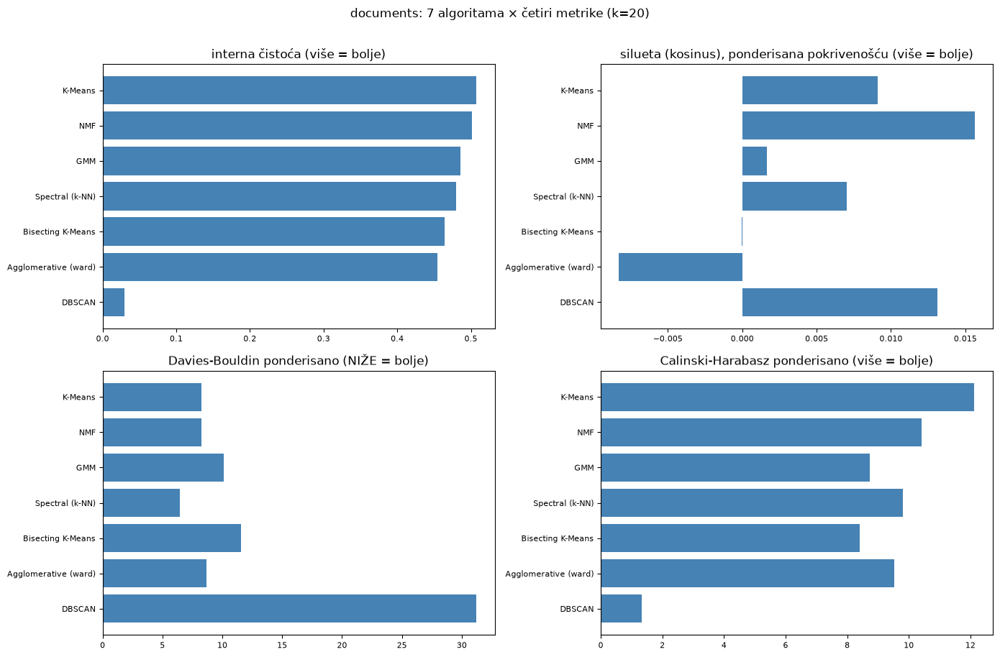

In [22]:
labels_of = algorithm_table(F)

### Slaganje particija po ARI

In [23]:
def method_ari(labels_of, csv_name="method_ari.csv",
               level="documents"):
    names = list(labels_of)
    n = len(names)
    A = np.eye(n)
    for i in range(n):
        for j in range(i + 1, n):
            A[i, j] = A[j, i] = adjusted_rand_score(
                labels_of[names[i]], labels_of[names[j]])
    df = pd.DataFrame(A, index=names, columns=names)
    df.to_csv(csv_name)
    pairs = sorted(((A[i, j], names[i], names[j])
                    for i in range(n) for j in range(i + 1, n)),
                   reverse=True)
    print(f"\n--- Method ARI, {level} k={K_MAIN}: range "
          f"{min(p[0] for p in pairs):.2f}..{pairs[0][0]:.2f} ---")
    for value, a, b in pairs[:6]:
        print(f"  {value:.3f}  {a} <-> {b}")
    display(df.round(2))
    fig, ax = plt.subplots(figsize=(9, 7.5))
    im = ax.imshow(A, cmap="Blues", vmin=-0.1, vmax=1.0)
    ax.set_xticks(range(n))
    ax.set_xticklabels(names, rotation=40, ha="right", fontsize=8)
    ax.set_yticks(range(n))
    ax.set_yticklabels(names, fontsize=8)
    for i in range(n):
        for j in range(n):
            ax.text(j, i, f"{A[i, j]:.2f}", ha="center", va="center",
                    fontsize=7,
                    color="white" if A[i, j] > 0.6 else "black")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.02).set_label("ARI")
    ax.set_title(f"ARI između particija algoritama, {level} "
                 f"(k={K_MAIN})")
    fig.tight_layout()
    show_fig(f"{_safe_filename(level)}_method_ari.png")



--- Method ARI, documents k=20: range 0.01..0.39 ---
  0.388  K-Means <-> GMM
  0.251  K-Means <-> NMF
  0.251  K-Means <-> Bisecting K-Means
  0.227  GMM <-> NMF
  0.201  Bisecting K-Means <-> GMM
  0.149  K-Means <-> Agglomerative (ward)


,K-Means,Bisecting K-Means,GMM,Agglomerative (ward),NMF,DBSCAN,Spectral (k-NN)
K-Means,1.00,0.25,0.39,0.15,0.25,0.02,0.14
Bisecting K-Means,0.25,1.00,0.20,0.09,0.15,0.01,0.06
GMM,0.39,0.20,1.00,0.12,0.23,0.01,0.09
Agglomerative (ward),0.15,0.09,0.12,1.00,0.13,0.04,0.14
NMF,0.25,0.15,0.23,0.13,1.00,0.02,0.13
DBSCAN,0.02,0.01,0.01,0.04,0.02,1.00,0.10
Spectral (k-NN),0.14,0.06,0.09,0.14,0.13,0.10,1.00


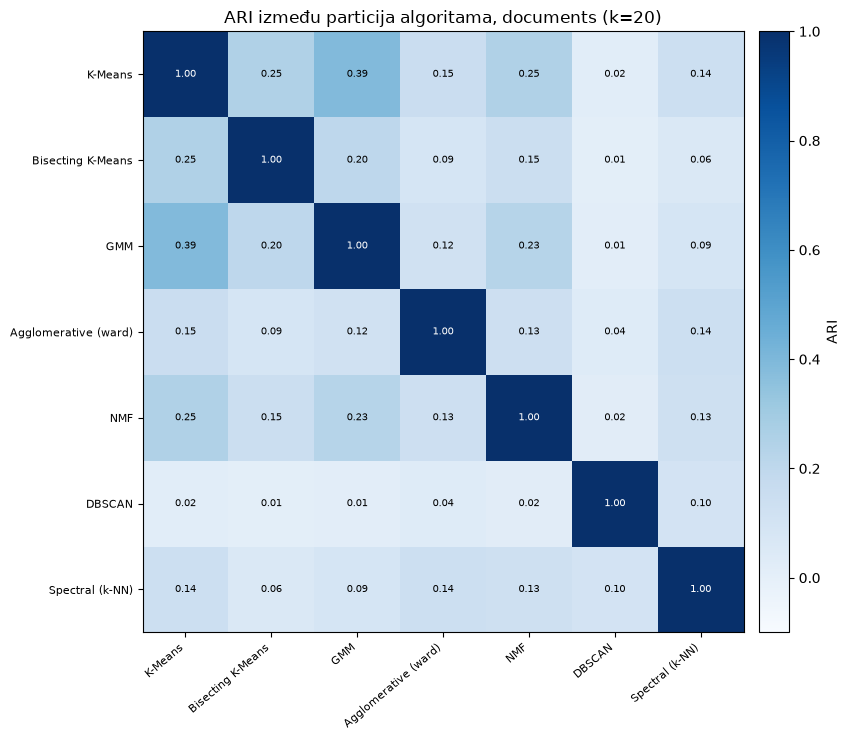

In [24]:
method_ari(labels_of)

### Scatteri po algoritmima (dve projekcije svaka)


[01:45:35] vizuelizacija: SVD(50) projekcija sirovog TF-IDF + t-SNE ...
  [keš] viz50_docs.pkl izračunato i sačuvano
  [keš] tsne_docs.pkl izračunato i sačuvano


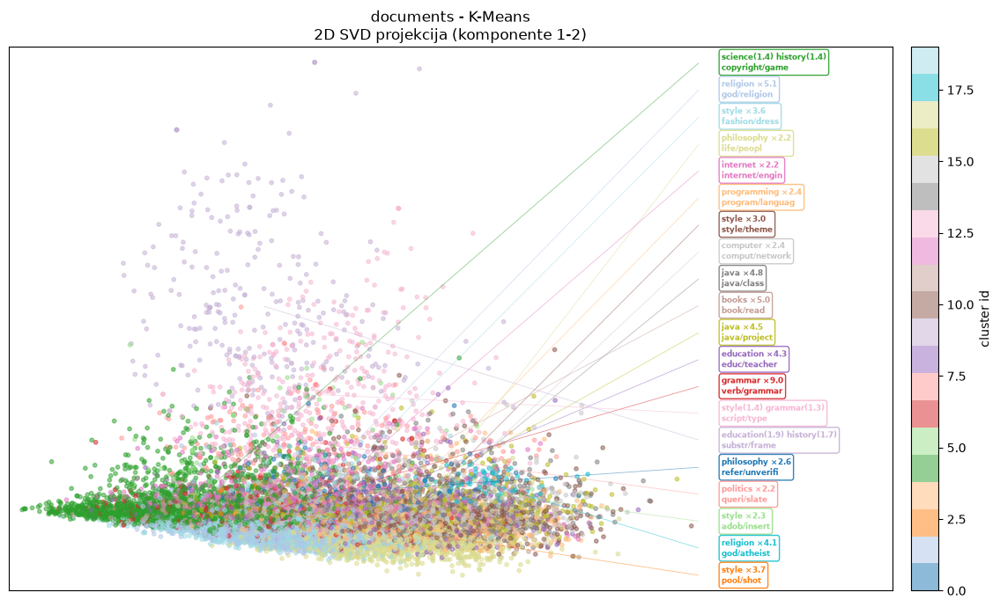

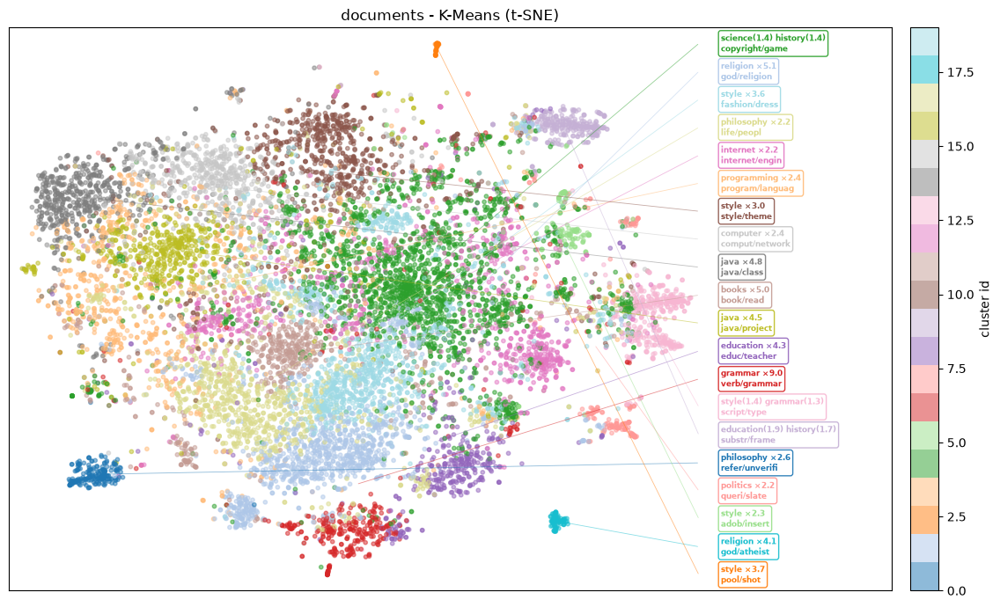

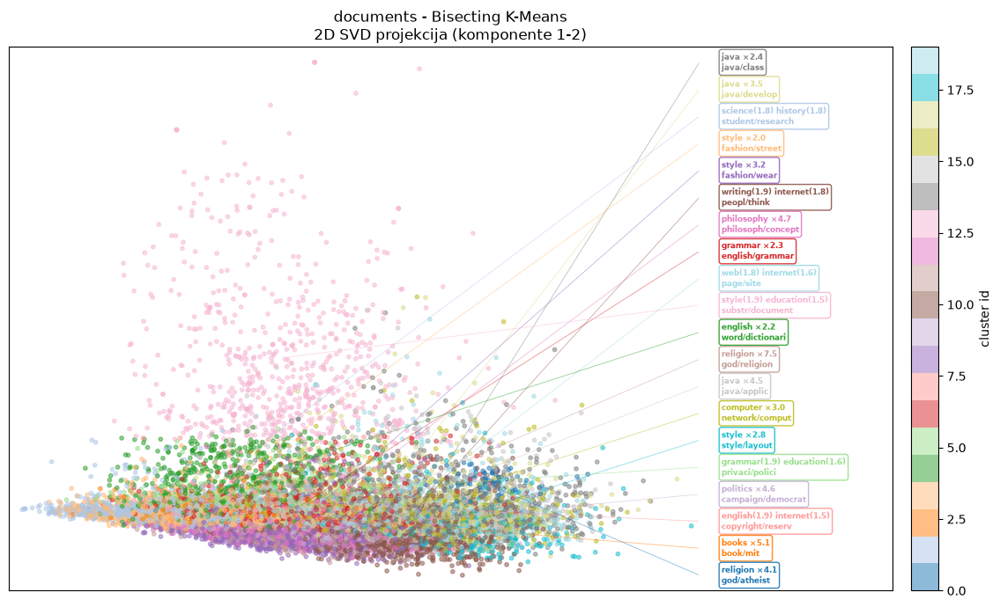

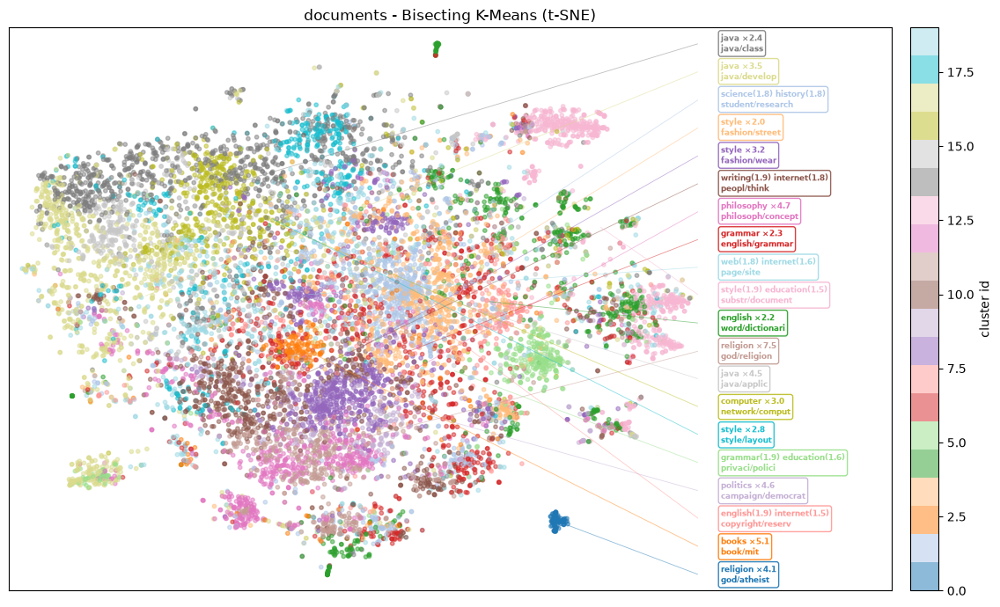

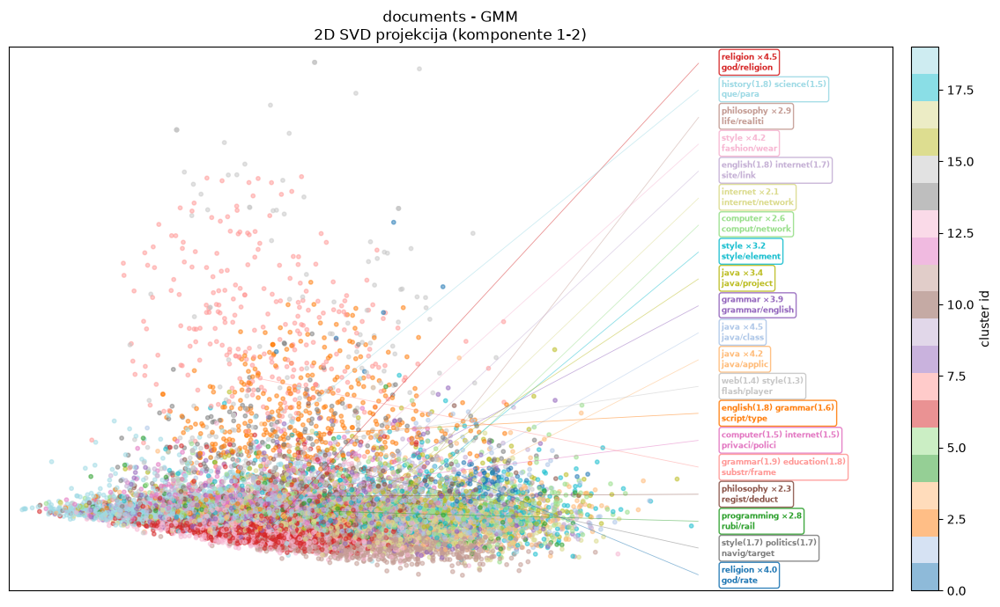

...

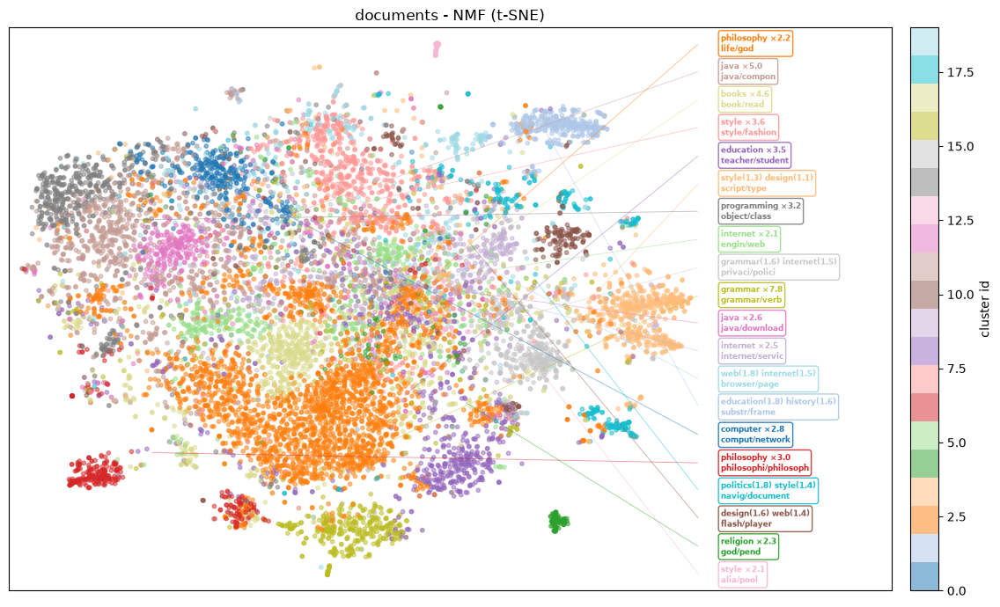

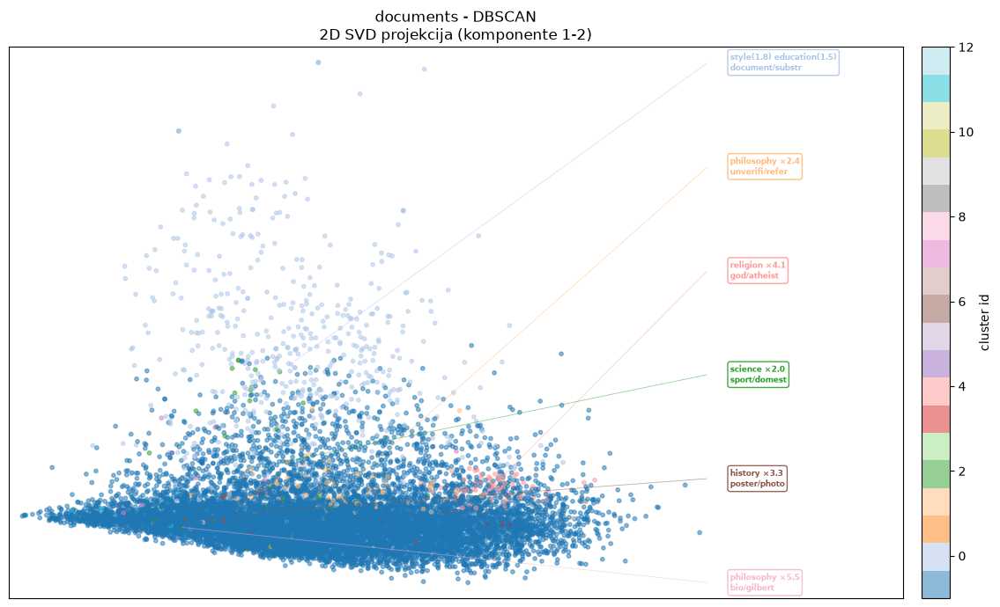

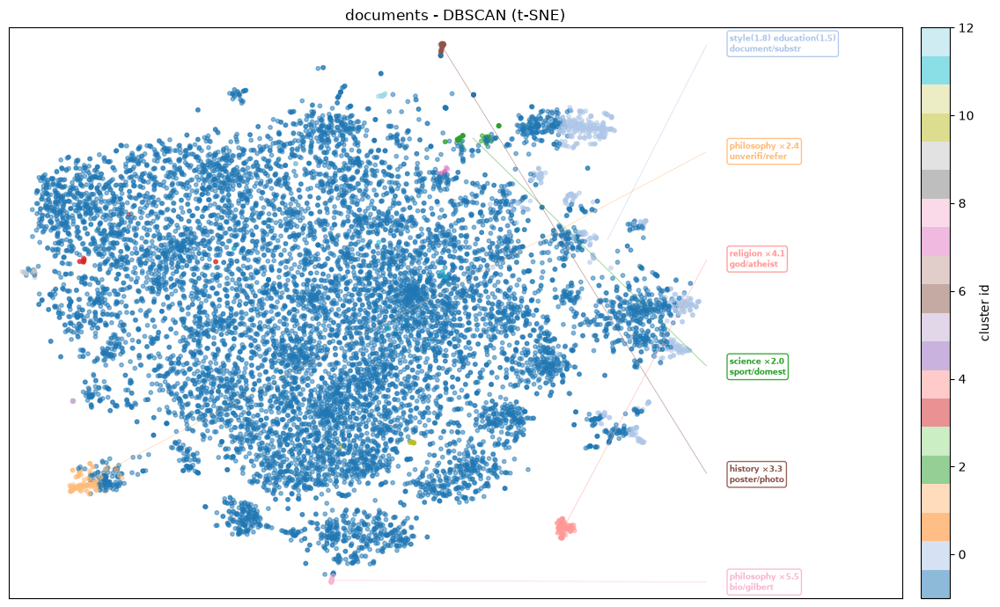

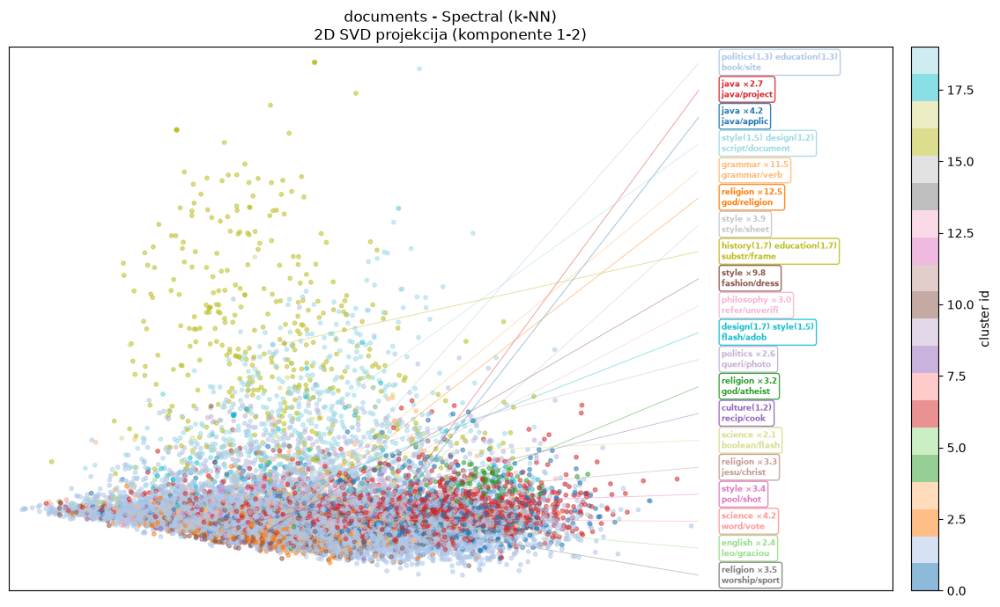

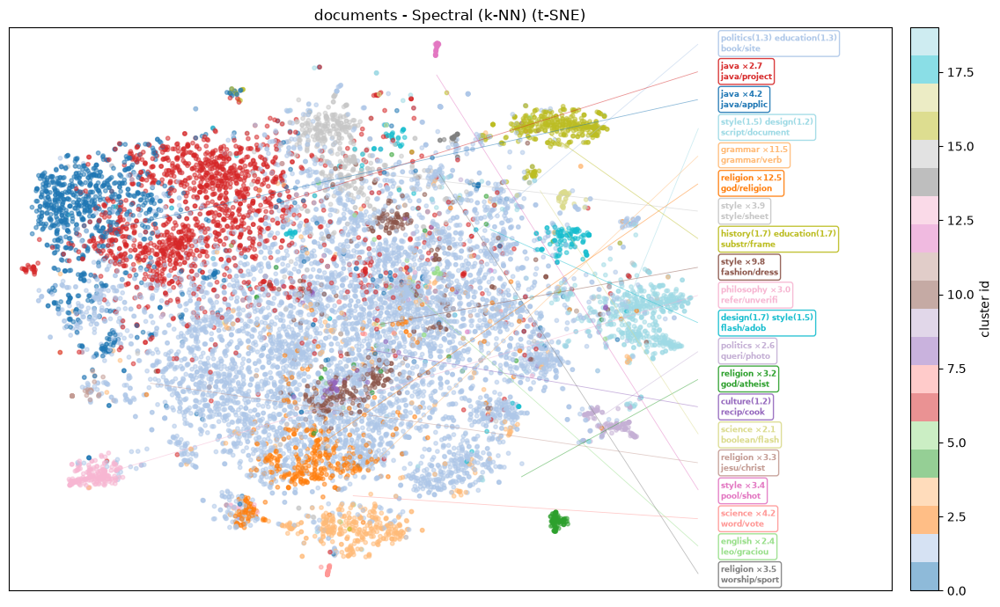

In [25]:
log("vizuelizacija: SVD(50) projekcija sirovog TF-IDF + t-SNE ...")
viz50 = cached("viz50_docs.pkl", lambda: TruncatedSVD(
    50, random_state=42).fit_transform(F["tfidf"]))
emb = cached("tsne_docs.pkl", lambda: TSNE(
    n_components=2, random_state=42, init="pca",
    learning_rate="auto").fit_transform(viz50))
per_algorithm_scatter(F, labels_of, emb, viz50[:, :2],
                      level="documents")

## 6. Hijerarhija mikro-tema (k=72 → Ward nad centroidima)


In [26]:
def hierarchy_and_groups(F, emb=None, k_fine=K_FINE):
    red, Y = F["red"], F["Y"]
    def _micro():
        log(f"mikro-sloj KMeans({k_fine}) + Ward stablo ...")
        km = KMeans(k_fine, random_state=42, n_init=10).fit(red)
        fine = km.labels_
        fine_words = {c: "/".join(discriminative_words(
            F["tfidf"], F["terms"], np.where(fine == c)[0],
            F["gmean"], n=2)) for c in range(k_fine)}
        return dict(fine=fine, fine_words=fine_words,
                    Z=linkage(km.cluster_centers_, method="ward"))
    d = cached("hierarchy_docs.pkl", _micro)
    fine, Z = d["fine"], d["Z"]
    fine_words = d["fine_words"]

    print("\n--- Tabela opsega: veličine grupa po rezovima (n>=500 / n<500) ---")
    range_rows = []
    for k_cut in range(2, 13):
        grp = fcluster(Z, t=k_cut, criterion="maxclust")
        large = small = 0
        parts = []
        for g in range(1, k_cut + 1):
            micros = np.where(grp == g)[0]
            if not len(micros):
                continue
            m = np.isin(fine, micros)
            n = int(m.sum())
            lift_c = _class_lift(Y, m)
            order = [j for j in np.argsort(lift_c)[::-1]
                     if np.isfinite(lift_c[j])]
            top = (f"{CLASS_NAMES[order[0]]}({lift_c[order[0]]:.1f})"
                   if order else "?")
            words = ", ".join(discriminative_words(
                F["tfidf"], F["terms"], np.where(m)[0],
                F["gmean"], n=3))
            is_large = n >= 500
            large += is_large
            small += not is_large
            parts.append(f"({n}d {top} | {words})")
        print(f"  k={k_cut:>2}: n>=500: {large}  n<500: {small} | "
              + " ".join(parts))
        range_rows.append(dict(k=k_cut, n_large=large,
                               n_small=small))
    pd.DataFrame(range_rows).to_csv("csv/range_table.csv",
                                    index=False)

    for k_cut in range(3, 11):
        cut_height = sorted(Z[:, 2], reverse=True)[k_cut - 1]
        fig, ax = plt.subplots(figsize=(22, 8))
        dendrogram(Z, labels=[fine_words[c] for c in range(k_fine)],
                   leaf_rotation=90, leaf_font_size=6.5, ax=ax,
                   color_threshold=cut_height * 1.001)
        ax.axhline(cut_height, color="red", ls="--", alpha=0.7)
        ax.set_title(f"Hijerarhija mikro={k_fine}, rez na "
                     f"{k_cut} super-grupa (boje prate rez; "
                     "nererešene veze stoje na liniji)")
        fig.tight_layout()
        show_fig(f"dendro72_cut{k_cut}.png")

    log("t-SNE nad dokumentima (nekoliko minuta) ...")
    if emb is None:
        emb = TSNE(n_components=2, random_state=42, init="pca",
                   learning_rate="auto").fit_transform(red)
    grp = fcluster(Z, t=4, criterion="maxclust")[fine] - 1
    fig, ax = plt.subplots(figsize=(11, 8))
    colors = plt.cm.tab10(np.arange(4))
    for c in range(4):
        m = grp == c
        lift_c = _class_lift(Y, m)
        order = [j for j in np.argsort(lift_c)[::-1]
                 if np.isfinite(lift_c[j])]
        names = [CLASS_NAMES[j] for j in order[:3]]
        tag = (" (šablonski fragment)" if (m.sum() < 500 and order)
               else "")
        ax.scatter(emb[m, 0], emb[m, 1], s=8, alpha=0.5,
                   color=colors[c],
                   label=f"T{c}: {', '.join(names)}{tag} "
                         f"({int(m.sum())}d)")
    ax.set_title("Super-grupe reza 4 (t-SNE)")
    ax.legend(markerscale=2, fontsize=8)
    ax.set_xticks([]); ax.set_yticks([])
    fig.tight_layout(); show_fig("supergroups_tsne_4.png")

    return dict(fine=fine, Z=Z)

[01:48:10] mikro-sloj KMeans(72) + Ward stablo ...
  [keš] hierarchy_docs.pkl izračunato i sačuvano

--- Tabela opsega: veličine grupa po rezovima (n>=500 / n<500) ---
  k= 2: n>=500: 1  n<500: 1 | (12157d java(1.0) | site, file, code) (77d religion(4.1) | load, favorit, pend)
  k= 3: n>=500: 1  n<500: 2 | (12120d programming(1.0) | site, file, code) (37d style(3.7) | alia, guest, photo) (77d religion(4.1) | load, favorit, pend)
  k= 4: n>=500: 2  n<500: 2 | (1119d style(1.3) | document, substr, frame) (11001d philosophy(1.1) | make, time, work) (37d style(3.7) | alia, guest, photo) (77d religion(4.1) | load, favorit, pend)
  k= 5: n>=500: 2  n<500: 3 | (1119d style(1.3) | document, substr, frame) (10974d programming(1.1) | make, work, import) (27d science(4.5) | rate, word, vote) (37d style(3.7) | alia, guest, photo) (77d religion(4.1) | load, favorit, pend)
  k= 6: n>=500: 2  n<500: 4 | (1083d education(1.2) | document, frame, substr) (36d style(2.4) | navig, fals, split) (10974d pro

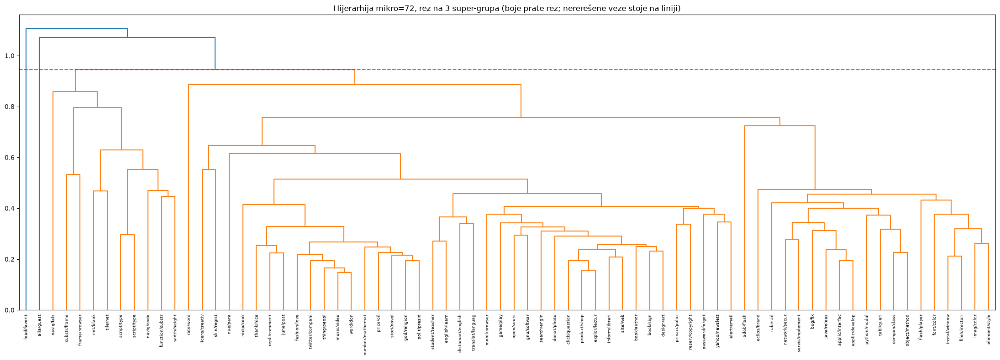

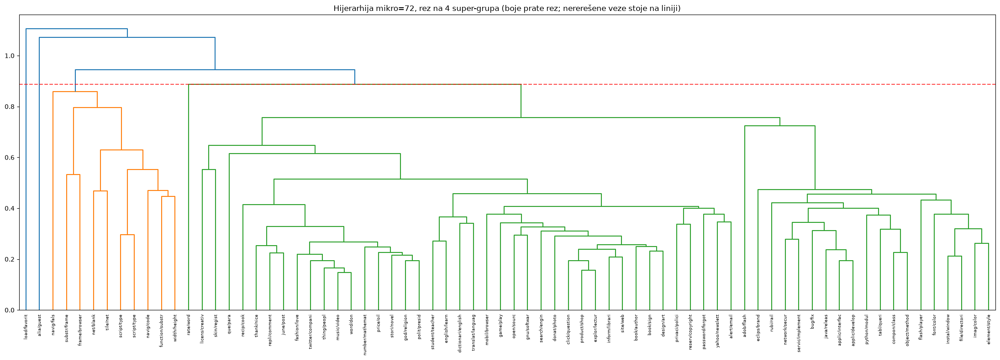

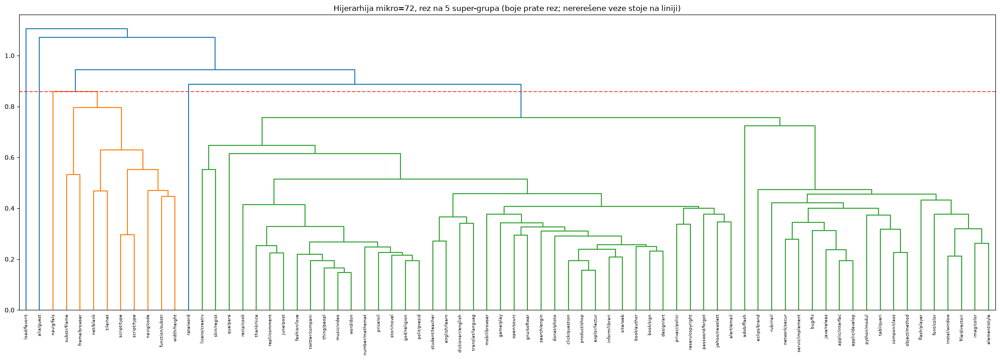

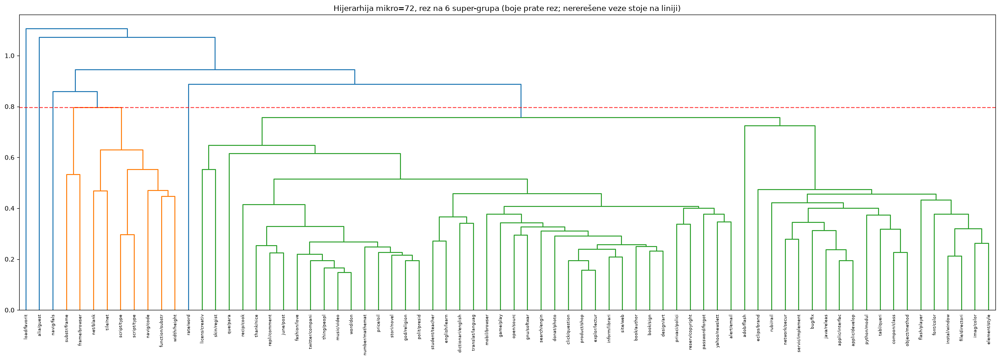

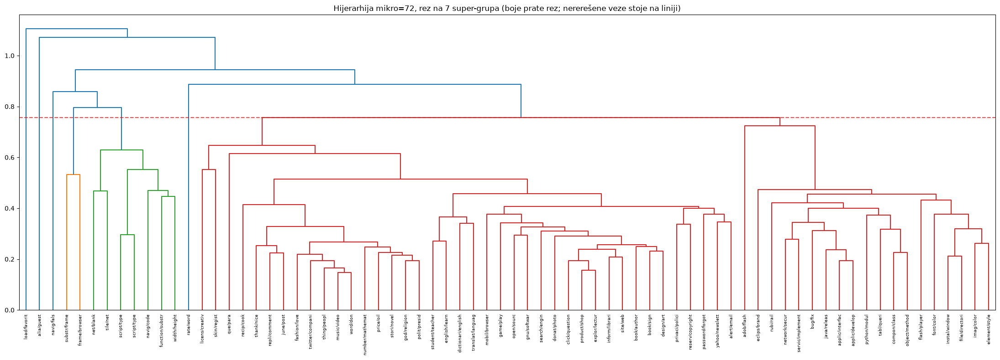

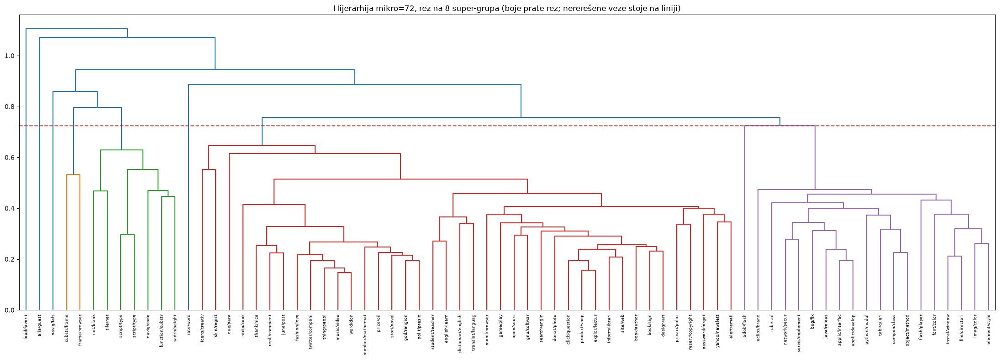

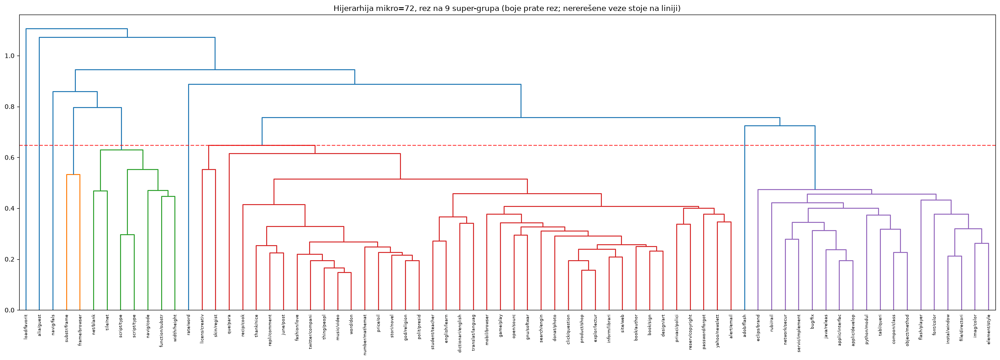

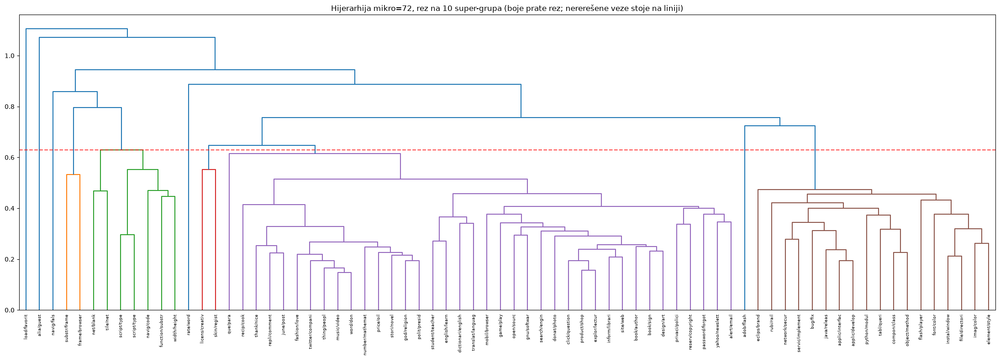

[01:49:27] t-SNE nad dokumentima (nekoliko minuta) ...


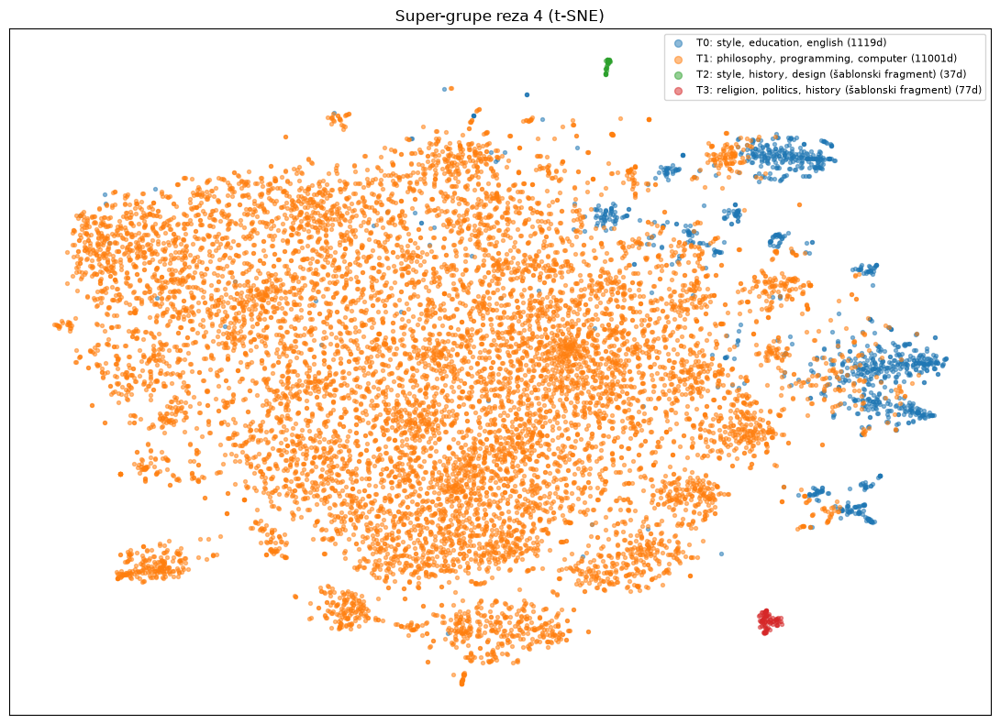

In [27]:
hierarchy_df = hierarchy_and_groups(F, emb)

## 7. Anotirane rečenice — odnos dokumenata i rečenica, kalibracija nasleđa


In [28]:
def annotated_check(vocab, doc_capture=None):
    test_sentences = parse_sentences("test-data.dat")
    doc, pos, rows = [], [], []
    with open("labeled_test_sentences.dat") as file:
        for line in file:
            parts = line.split()
            doc.append(int(parts[0]))
            pos.append(int(parts[1]))
            rows.append([int(x) for x in parts[2:2 + N_CLASSES]])
    Y = np.array(rows, dtype=int)
    texts = [" ".join(vocab.get(w, "?") for w in
                      test_sentences[d][s])
             for d, s in zip(doc, pos)]
    vec = TfidfVectorizer(max_df=0.5, min_df=3, stop_words="english",
                          sublinear_tf=True)
    tfidf = vec.fit_transform(texts)
    red = tfidf
    print(f"\nAnotirane rečenice: {len(texts)} redova; sirovi "
          f"TF-IDF prostor: {tfidf.shape[1]} osobina")
    G = dict(tfidf=tfidf, terms=vec.get_feature_names_out(),
             red=red, Y=Y, gmean=np.asarray(
                 tfidf.mean(axis=0)).ravel())
    labels = k20_alignment(G, level="anotirane rečenice (1468)",
                           tag="annotated_sentences")
    k20_class_heatmap(G, labels, level="anotirane rečenice (1468)",
                      tag="annotated_sentences")
    per_class_alignment(labels, Y, level="anotirane rečenice",
                        tag="annotated_sentences")
    capture = multilabel_purity(labels, Y)
    Yte = pd.read_csv("test-label.dat", sep=" ",
                      header=None).values
    Y_inh = np.array([Yte[d] for d in doc], dtype=int)
    capture_inh = multilabel_purity(labels, Y_inh)
    print(f"\n--- Kalibracija nasleđa (ista particija, dva izvora "
          "oznaka) ---")
    print(f"  capture po pravim oznakama    : {capture:.3f}")
    print(f"  capture po nasleđenim oznakama: {capture_inh:.3f}")
    print(f"  => odnos nasleđeno/pravo: {capture_inh / capture:.2f}x")
    if doc_capture is None:
        F = build_features(vocab, scan_representation=False)
        doc_labels = KMeans(K_MAIN, random_state=42,
                            n_init=10).fit(F["red"]).labels_
        doc_capture = multilabel_purity(doc_labels, F["Y"])
    print(f"  dokumenti (ista receptura)    : {doc_capture:.3f}")
    print(f"  => odnos capture(dokumenti)/capture(rečenice): "
          f"{doc_capture / capture:.2f}x")
    return capture



Anotirane rečenice: 1468 redova; sirovi TF-IDF prostor: 805 osobina
  [keš] k20_annotated_sentences.pkl izračunato i sačuvano

--- k=20 imenovanje liftom, anotirane rečenice (1468) (capture 0.279) ---
  cl19 ( 713) [politicsx1.6]: june, skin, main, video, come
  cl 2 ( 103) [designx3.8]: use, design, web, graphic, easi
  cl11 (  58) [javax9.0]: java, applic, run, develop, web
  cl 3 (  53) [internetx6.0]: site, web, creat, servic, advertis
  cl12 (  45) [educationx4.0]: learn, free, encyclopedia, activ, english
  cl 9 (  45) [computerx5.4]: look, peopl, research, degre, comput
  cl13 (  42) [booksx13.5]: book, read, john, articl, guy
  cl 5 (  40) [languagex8.3]: languag, program, script, process, gener
  cl 0 (  39) [programmingx4.5]: code, sourc, static, librari, class
  cl15 (  38) [programmingx2.6]: program, includ, answer, cours, quit
  cl16 (  37) [stylex8.4]: don, follow, fashion, realli, core
  cl 8 (  37) [educationx1.6]: work, student, python, summer, start
  cl 7 (  36) [cu

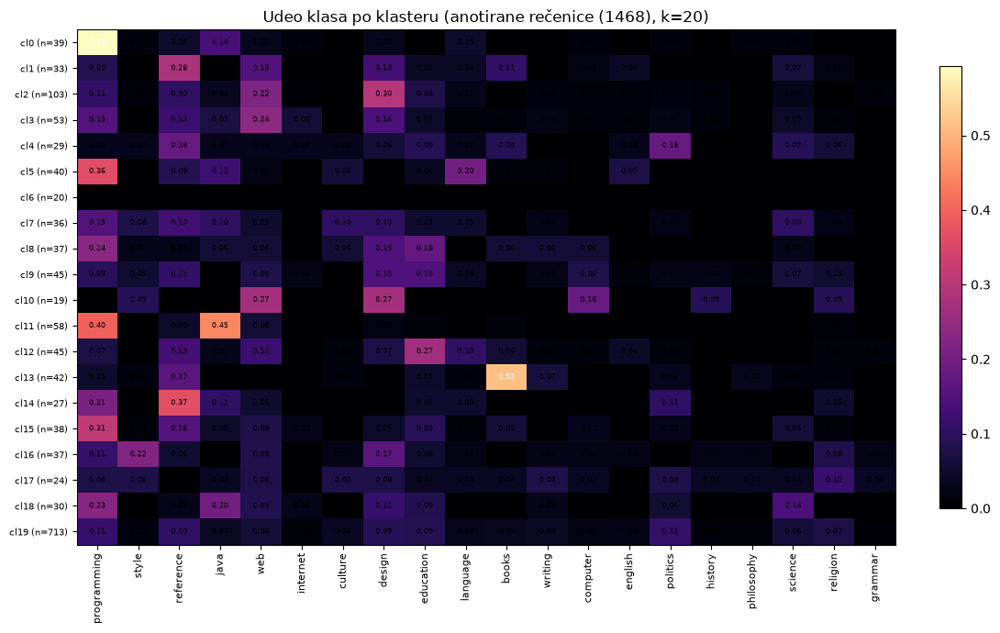


--- Poravnanje po klasama, anotirane rečenice ---
 class_name  support  capture  precision
   politics      112    0.821      0.124
      books       80    0.388      0.738
       java      129    0.357      0.793
     design      186    0.263      0.476
   language       71    0.225      0.400
   internet       23    0.217      0.094
      style       38    0.211      0.216
programming      296    0.186      0.567
   computer       36    0.167      0.133
  education      147    0.163      0.293
  reference      195    0.103      0.333
    culture       46    0.087      0.111
    science       86    0.058      0.167
   religion       79    0.038      0.125
        web      156    0.019      0.158
    writing       51    0.000      0.000
    history       17    0.000      0.000
    english       38    0.000      0.000
 philosophy       14    0.000      0.000
    grammar       11    0.000      0.000
  zero-capture: writing, history, english, philosophy, grammar

--- Kalibracija nasleđa 

0.2786103542234332

In [31]:
annotated_check(vocab, doc_capture=multilabel_purity(doc_labels, F["Y"]))

## 8. Sloj od 223k rečenica — isto kao za dokumenta


In [32]:
def build_sentence_features(vocab, n_sample=20000):
    def _compute():

        Ytr = pd.read_csv("train-label.dat", sep=" ",
                          header=None).values
        Yte = pd.read_csv("test-label.dat", sep=" ",
                          header=None).values
        texts, rows, doc_ids = [], [], []
        pos = {}
        n_test = Yte.shape[0]
        for split, path in (("train", "train-data.dat"),
                            ("test", "test-data.dat")):
            split_labels = Ytr if split == "train" else Yte
            base = n_test if split == "train" else 0
            for d, sents in enumerate(parse_sentences(path)):
                row = split_labels[d]
                for s, words in enumerate(sents):
                    pos[(split, d, s)] = len(texts)
                    doc_ids.append(base + d)
                    texts.append(" ".join(vocab.get(w, "?")
                                          for w in words))
                    rows.append(row)
        Y = np.array(rows, dtype=np.int8)
        g_idx, g_y = [], []
        with open("labeled_test_sentences.dat") as file:
            for line in file:
                parts = line.split()
                key = ("test", int(parts[0]), int(parts[1]))
                if key in pos:
                    g_idx.append(pos[key])
                    g_y.append([int(x)
                                for x in parts[2:2 + N_CLASSES]])
        g_idx = np.array(g_idx)
        g_y = np.array(g_y, dtype=int)
        vec = TfidfVectorizer(max_df=0.5, min_df=3,
                              stop_words="english", sublinear_tf=True)
        tfidf = vec.fit_transform(texts)
        print(f"Rečenice: {tfidf.shape[0]} redova (svi dokumenti); "
              f"tfidf osobina {tfidf.shape[1]}")
        S = dict(tfidf=tfidf, terms=vec.get_feature_names_out(),
                 Y=Y, doc_ids=np.asarray(doc_ids),
                 g_idx=g_idx, g_y=g_y,
                 gmean=np.asarray(tfidf.mean(axis=0)).ravel())
        sub = np.sort(np.random.default_rng(42).choice(
            len(texts), size=n_sample, replace=False))
        S["sample_idx"] = sub
        S["sample"] = dict(idx=sub, tfidf=tfidf[sub], Y=Y[sub],
                           gmean=S["gmean"], terms=S["terms"])
        return S
        return S
    return cached("sent_features.pkl", _compute)

In [33]:
S = build_sentence_features(vocab)
# sirovi prolaz: radni prostor rečenica je TF-IDF bez SVD-a
S["rep_name"] = "raw TF-IDF (L2)"
S["red"] = S["tfidf"]
S["sample"]["red"] = S["sample"]["tfidf"]
print("rečenice, radni prostor:", S["rep_name"],
      "| red:", S["red"].shape)

Rečenice: 223288 redova (svi dokumenti); tfidf osobina 8385
  [keš] sent_features.pkl izračunato i sačuvano
rečenice, radni prostor: raw TF-IDF (L2) | red: (223288, 8385)


### Radni prostor rečenica: sirovi TF-IDF

U glavnoj svesci se ovde bira dimenzija SVD-a; u sirovom prolazu se preskače — radni prostor je ceo TF-IDF vokabular (postavljeno u ćeliji iznad). SVD(2)/SVD(50) se računaju kasnije samo za slike.

### Prirodni broj klastera rečenica — k=2..40 + stabilnost


In [34]:
def sentence_k_scan(S, ks=range(2, 41),
                    ladder_ks=(3, 4, 5, 8, 12, 20, 40)):
    Xs = S["sample"]["red"]

    def _compute():
        rows = []
        for k in ks:
            km = KMeans(k, random_state=42, n_init=3).fit(Xs)
            m = internal_metrics(Xs, km.labels_)
            rows.append(dict(k=k, sil=round(m["silhouette"], 4),
                             db=round(m["davies_bouldin"], 3),
                             ch=round(m["calinski"], 1),
                             inertia=round(km.inertia_, 1)))
        df = pd.DataFrame(rows)
        lad = []
        for k in ladder_ks:
            parts = [KMeans(k, random_state=s, n_init=10)
                     .fit_predict(Xs) for s in SEEDS]
            ari = (adjusted_rand_score(parts[0], parts[1])
                   + adjusted_rand_score(parts[0], parts[2])) / 2
            lad.append(dict(k=k, seed_ari=round(float(ari), 3)))
        return dict(df=df, ladder=pd.DataFrame(lad),
                    best_k=int(df.loc[df.sil.idxmax(), "k"]))
    d = cached("sent_kscan.pkl", _compute)
    df, ladder, k_sil = d["df"], d["ladder"], d["best_k"]
    df.to_csv("csv/sent_kscan_2_40.csv", index=False)
    ladder.to_csv("csv/sent_stability.csv", index=False)
    print("\n--- Rečenice: interni metrici k=2..40 (uzorak 20k) ---")
    print(f"  silueta argmax k={k_sil} ({df.sil.max():.4f}); DB argmin "
          f"k={int(df.loc[df.db.idxmin(), 'k'])}; CH argmax "
          f"k={int(df.loc[df.ch.idxmax(), 'k'])}")
    print("--- Rečenice: lestvica stabilnosti po semena (uzorak) ---")
    for _, r in ladder.iterrows():
        print(f"  k={int(r.k):>2}: seed-ARI {r.seed_ari:.3f}")
    fig, axes = plt.subplots(2, 2, figsize=(13, 8))
    axes[0, 0].plot(df.k, df.inertia, marker="o")
    axes[0, 0].set_title("Elbow (inercija)")
    axes[0, 1].plot(df.k, df.sil, marker="s", color="orange")
    axes[0, 1].axvline(k_sil, color="green", ls=":")
    axes[0, 1].set_title("Silueta (kosinus)")
    axes[1, 0].plot(df.k, df.db, marker="^", color="seagreen")
    axes[1, 0].set_title("Davies-Bouldin (niže = bolje)")
    axes[1, 1].plot(df.k, df.ch, marker="d", color="purple")
    axes[1, 1].set_title("Calinski-Harabasz (više = bolje)")
    for ax in axes[1]:
        ax.set_xlabel("k")
    for ax in axes.ravel():
        ax.grid(alpha=.3)
    fig.suptitle("Rečenice: izbor k (uzorak 20k), sva četiri metrika")
    fig.tight_layout(); show_fig("sent_kscan_2_40.png")
    fig, ax = plt.subplots(figsize=(7, 4))
    ax.bar([str(int(k)) for k in ladder.k], ladder.seed_ari,
           color="steelblue")
    ax.axhline(0.9, color="red", ls="--")
    ax.set_title("Rečenice: stabilnost po semena (uzorak); prag 0.9")
    ax.grid(alpha=.3, axis="y")
    fig.tight_layout(); show_fig("sent_stability.png")
    return k_sil

  [keš] sent_kscan.pkl izračunato i sačuvano

--- Rečenice: interni metrici k=2..40 (uzorak 20k) ---
  silueta argmax k=39 (0.0251); DB argmin k=2; CH argmax k=2
--- Rečenice: lestvica stabilnosti po semena (uzorak) ---
  k= 3: seed-ARI 0.345
  k= 4: seed-ARI 0.547
  k= 5: seed-ARI 0.476
  k= 8: seed-ARI 0.381
  k=12: seed-ARI 0.379
  k=20: seed-ARI 0.367
  k=40: seed-ARI 0.460


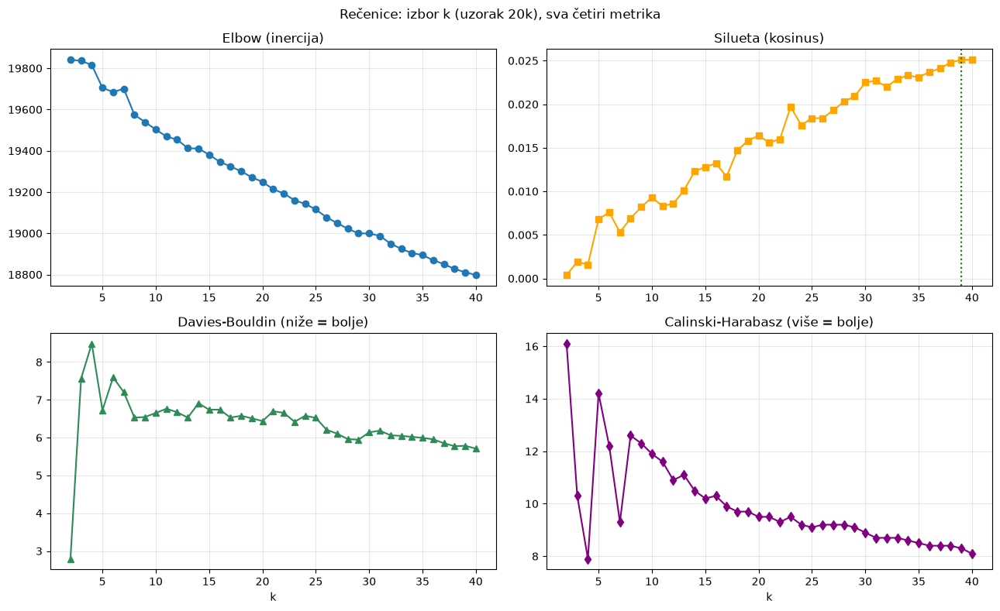

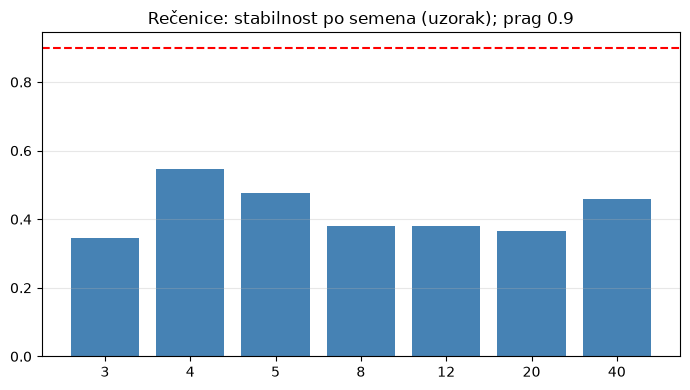

In [35]:
SENT_K = sentence_k_scan(S)

### Četiri algoritma na 223k rečenica

(BIRCH preskačen u sirovom prolazu zbog memorije potklastera.)


In [36]:
def fit_birch_guarded(red, k, max_sub=8000,
                       thresholds=(0.5, 0.6, 0.7, 0.75, 0.8, 0.85, 0.9)):
    cand = []
    for th in thresholds:
        n_sub = len(Birch(n_clusters=None, threshold=th)
                    .fit(red).subcluster_centers_)
        log(f"    [birch-th] th={th}: {n_sub} pod-klastera")
        if 2 <= n_sub <= max_sub:
            cand.append(th)
        if n_sub > max_sub and cand:
            break
    if not cand:
        log("    [birch-th] nema pragova u opsegu -> BIRCH preskače "
            "(fazna granica: previše pod-klastera <-> jedan džinovski)")
        return None, None
    best = None
    for th in cand:
        lbl = Birch(n_clusters=k, threshold=th).fit(red).labels_
        sizes = np.bincount(lbl)
        bal = sizes.min() / sizes.max()
        m = internal_metrics(red, lbl)
        log(f"    [birch-th] th={th}: silueta {m['silhouette']:.3f}, "
            f"balans {bal:.2f}")
        if best is None or bal > best[2]:
            best = (th, lbl, bal)
    return best[0], best[1]



def knn_label_profiles(red, g_idx, g_y, k=25):
    from sklearn.neighbors import NearestNeighbors
    nn = NearestNeighbors(n_neighbors=k).fit(red[g_idx])
    _, idx = nn.kneighbors(red)
    return g_y[idx].mean(axis=1)



def sentence_cluster_names(S, labels, probs, min_share=0.05):
    Y = S["Y"].astype(int)
    base = probs.mean(0)
    out = {}
    for c in sorted(set(labels) - {-1}):
        m = labels == c
        prof = probs[m].mean(0)
        lift = prof / np.maximum(base, 1e-12)
        ok = (prof >= min_share) & (lift >= 1.0)
        if ok.any():
            di = int(np.argmax(np.where(ok, lift, -np.inf)))
            knn = (CLASS_NAMES[di], round(float(lift[di]), 1))
        else:
            knn = ("(mixed)", None)
        lift_c = _class_lift(Y, m)
        di2 = int(np.argmax(lift_c))
        inh = ((CLASS_NAMES[di2], round(float(lift_c[di2]), 1))
               if np.isfinite(lift_c[di2]) else ("(mixed)", None))
        out[c] = dict(knn=knn, inherited=inh, n=int(m.sum()))
    return out



def sentence_algorithms(S, k):
    red, Y = S["red"], S["Y"].astype(int)
    Xs = S["sample"]["red"]

    def _skan():
        results, labels_of = [], {}

        def record(name, labels):
            m = internal_metrics(red, labels)
            results.append(dict(
                algorithm=name,
                purity_inherited=round(multilabel_purity(labels, Y), 4),
                capture_1468_true=round(multilabel_purity(
                    labels[S["g_idx"]], S["g_y"]), 4), **m))
            labels_of[name] = np.asarray(labels)

        km_labels = KMeans(k, random_state=42, n_init=10).fit(red).labels_
        record("K-Means", km_labels)
        record("Bisecting K-Means",
               BisectingKMeans(k, random_state=42).fit(red).labels_)
        Xs_dense = np.asarray(Xs.todense(), dtype=np.float32)
        best_cov, best_bic = "diag", np.inf
        for cov in ("spherical", "diag"):
            bic = GaussianMixture(k, covariance_type=cov,
                                  random_state=42).fit(Xs_dense) \
                .bic(Xs_dense)
            print(f"  [gmm-bic] {cov}: {bic:.0f}")
            if bic < best_bic:
                best_cov, best_bic = cov, bic
        gmm = GaussianMixture(k, covariance_type=best_cov,
                              random_state=42).fit(Xs_dense)
        # predikcija po delovima: 223k x ~8.5k ne staje odjednom
        gmm_pred = np.empty(red.shape[0], dtype=np.int64)
        step = 10000
        for i in range(0, red.shape[0], step):
            chunk = np.asarray(red[i:i + step].todense(),
                               dtype=np.float32)
            gmm_pred[i:i + step] = gmm.predict(chunk)
        record("GMM", gmm_pred)
        # BIRCH se ne računa u sirovom prolazu (memorija)
        nmf = NMF(k, random_state=42, init="nndsvda",
                  max_iter=300).fit(S["tfidf"])
        record("NMF", nmf.transform(S["tfidf"]).argmax(1))
        return dict(results=results, labels_of=labels_of)

    d = cached(f"sent_algorithms_k{k}.pkl", _skan)
    results, labels_of = d["results"], d["labels_of"]
    df = pd.DataFrame(results).sort_values("capture_1468_true",
                                           ascending=False)
    df.to_csv("csv/sent_algorithm_table.csv", index=False)
    print(f"\n--- Rečenice: pet algoritama (k={k}), sortirano po "
          "čistoći na 1 468 anotiranih ---")
    print(df[["algorithm", "coverage", "purity_inherited",
              "capture_1468_true", "silhouette", "sil_w",
              "n_clusters"]].round(3).to_string(index=False))
    fig, axes = plt.subplots(2, 2, figsize=(14, 9))
    for ax, (col, title) in zip(axes.ravel(), [
            ("capture_1468_true",
             "čistoća na 1 468 oznaka nasleđenim k-NN (više = bolje)"),
            ("purity_inherited",
             "čistoća po nasleđenim oznakama (više = bolje)"),
            ("sil_w", "silueta × pokrivenost (više = bolje)"),
            ("db_w", "Davies-Bouldin / pokrivenost (niže = bolje)")]):
        ax.barh(df.algorithm, df[col], color="steelblue")
        ax.set_title(title); ax.invert_yaxis()
        ax.tick_params(labelsize=8)
    fig.suptitle(f"223k rečenica: pet algoritama (k={k})")
    fig.tight_layout(); show_fig("sent_algorithm_metrics.png")
    save_pkl("sentence_layer_algorithms.pkl",
             dict(k=k, representation=S.get("rep_name"), table=df,
                  labels=labels_of))

    km_labels = labels_of["K-Means"]
    probs = knn_label_profiles(red, S["g_idx"], S["g_y"].astype(float))
    names = sentence_cluster_names(S, km_labels, probs)
    rows = []
    print("\n--- Klasteri rečenica (k={}), imenovani iz dva izvora ---".format(k))
    for c in np.argsort(-np.bincount(km_labels)):
        if c not in names:
            continue
        idx = np.where(km_labels == c)[0]
        words = ", ".join(discriminative_words(
            S["tfidf"], S["terms"], idx, S["gmean"], n=5))
        kn, kl = names[c]["knn"]
        i_n, i_l = names[c]["inherited"]
        print(f"  cl{c:>2} ({names[c]['n']:>6}) kNN:[{kn}x{kl}] "
              f"nasleđe:[{i_n}x{i_l}]: {words}")
        rows.append(dict(cluster=c, n=names[c]["n"],
                         knn_name=kn, knn_lift=kl,
                         inherited_name=i_n, inherited_lift=i_l,
                         words=words))
    pd.DataFrame(rows).to_csv("csv/sent_cluster_names.csv", index=False)
    agree = sum(1 for r in rows if r["knn_name"] == r["inherited_name"])
    print(f"  slaganje imena kNN vs nasleđe: {agree}/{len(rows)} klastera")

    sub = S["sample_idx"]
    svd2s = cached("svd2_sent_sample.pkl", lambda: TruncatedSVD(
        2, random_state=42).fit(S["sample"]["tfidf"]))
    emb2 = svd2s.transform(S["sample"]["tfidf"])
    var2_s = float(svd2s.explained_variance_ratio_.sum())
    S["svd_evr2"] = var2_s
    svar2_s = f", {var2_s:.0%} varijanse"
    log("vizuelizacija: SVD(50) uzorka + t-SNE ...")
    viz50s = cached("viz50_sent_sample.pkl", lambda: TruncatedSVD(
        50, random_state=42).fit_transform(S["sample"]["tfidf"]))
    emb_t = cached("tsne_sent_sample.pkl", lambda: TSNE(
        n_components=2, random_state=42, init="pca",
        learning_rate="auto").fit_transform(viz50s))
    for name, lab in labels_of.items():
        names_n = sentence_cluster_names(S, lab, probs)
        stamps = {}
        for c in set(lab) - {-1}:
            idx = np.where(lab == c)[0]
            w = discriminative_words(S["tfidf"], S["terms"], idx,
                                     S["gmean"], n=2)
            kn_name, kn_lift = names_n.get(
                c, {}).get("knn", ("?", None))
            stamps[c] = (f"{kn_name} x{kn_lift}\n{'/'.join(w)}", 0)
        safe = _safe_filename(name)
        cluster_scatter(emb2, lab[sub], stamps,
                        f"sent_svd2d_{safe}.png",
                        f"223k rečenica (uzorak 20k) - {name} "
                        f"(2D SVD projekcija{svar2_s}; kNN pečati)")
        cluster_scatter(emb_t, lab[sub], stamps,
                        f"sent_tsne_{safe}.png",
                        f"223k rečenica (uzorak 20k) - {name} "
                        "(t-SNE uzorka; kNN pečati)")
    return df, labels_of

  [gmm-bic] spherical: -1050875961
  [gmm-bic] diag: -1703466664
  [keš] sent_algorithms_k39.pkl izračunato i sačuvano

--- Rečenice: pet algoritama (k=39), sortirano po čistoći na 1 468 anotiranih ---
        algorithm  coverage  purity_inherited  capture_1468_true  silhouette  sil_w  n_clusters
              NMF       1.0             0.389              0.298       0.020  0.020          39
          K-Means       1.0             0.400              0.276       0.025  0.025          39
Bisecting K-Means       1.0             0.388              0.260       0.009  0.009          39
              GMM       1.0             0.388              0.236       0.001  0.001          39


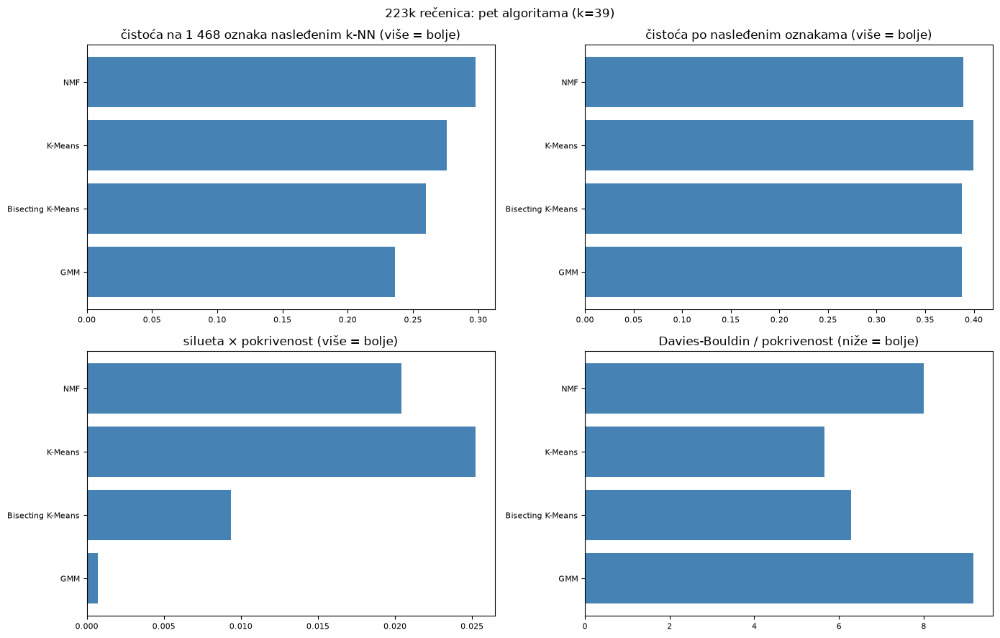

  [pkl] results\sentence_layer_algorithms.pkl

--- Klasteri rečenica (k=39), imenovani iz dva izvora ---
  cl 4 (106720) kNN:[politicsx1.4] nasleđe:[religionx1.3]: year, time, favorit, state, man
  cl21 (  8925) kNN:[javax1.7] nasleđe:[programmingx1.4]: use, term, tool, privaci, instead
  cl 7 (  4698) kNN:[webx1.1] nasleđe:[designx1.2]: work, licens, great, creativ, fine
  cl37 (  4564) kNN:[writingx1.4] nasleđe:[culturex1.2]: new, york, featur, releas, ad
  cl11 (  4349) kNN:[writingx1.7] nasleđe:[internetx1.1]: need, inform, help, know, provid
  cl24 (  4300) kNN:[designx1.2] nasleđe:[stylex1.2]: make, sure, easier, sens, easi
  cl10 (  4157) kNN:[languagex2.8] nasleđe:[languagex2.4]: peopl, languag, mani, english, program
  cl33 (  4083) kNN:[designx1.2] nasleđe:[stylex1.4]: content, type, follow, line, command
  cl29 (  4072) kNN:[designx2.5] nasleđe:[designx1.8]: post, design, june, respons, web
  cl 1 (  3855) kNN:[webx1.8] nasleđe:[webx1.7]: page, web, link, home, visit
  cl32 

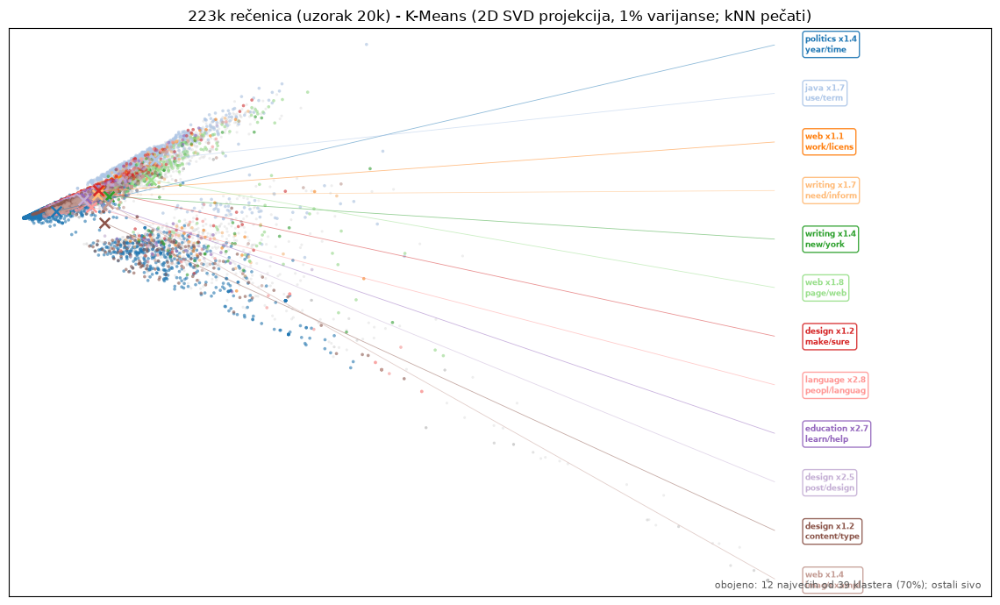

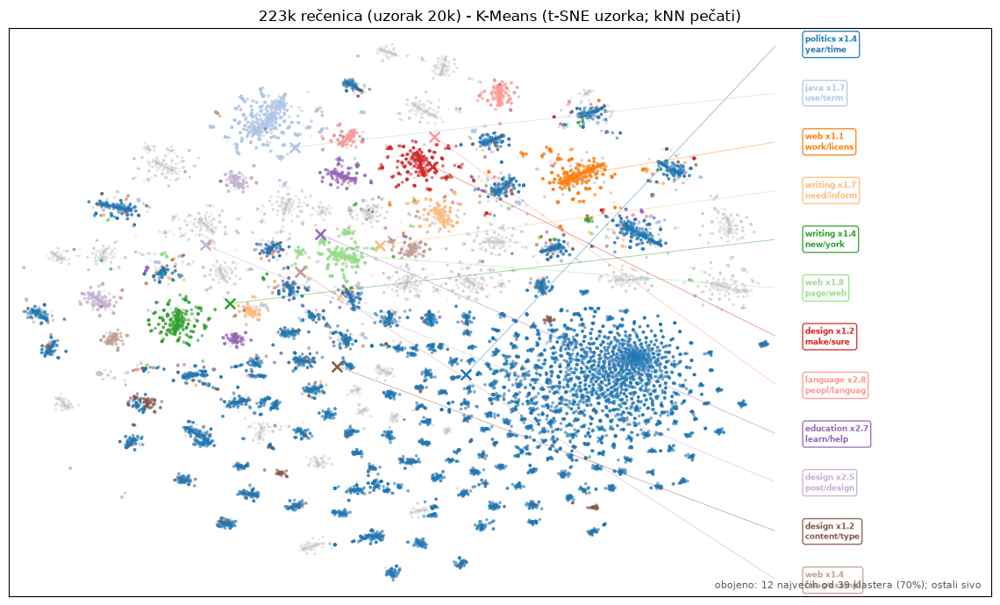

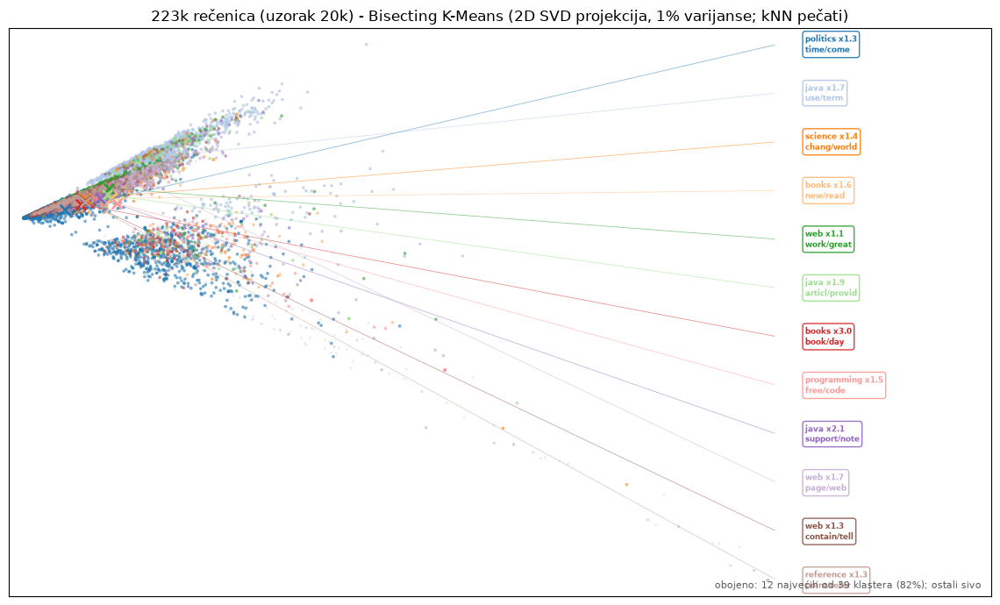

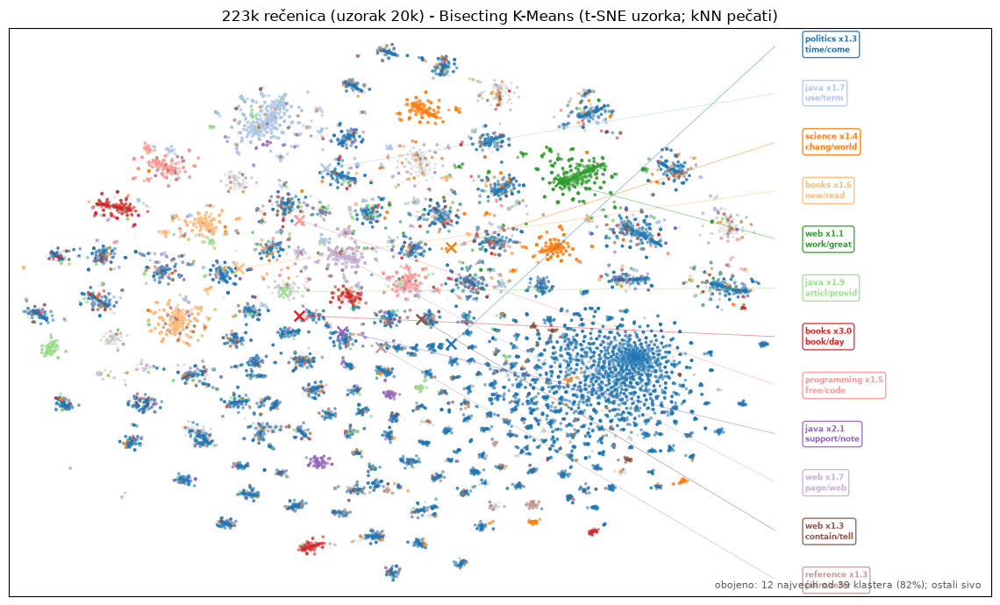

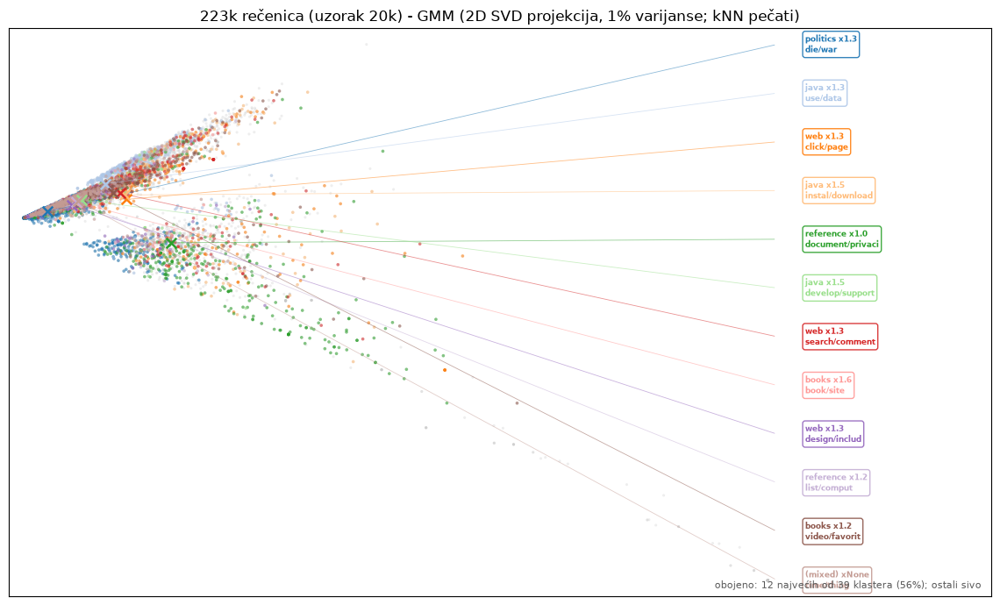

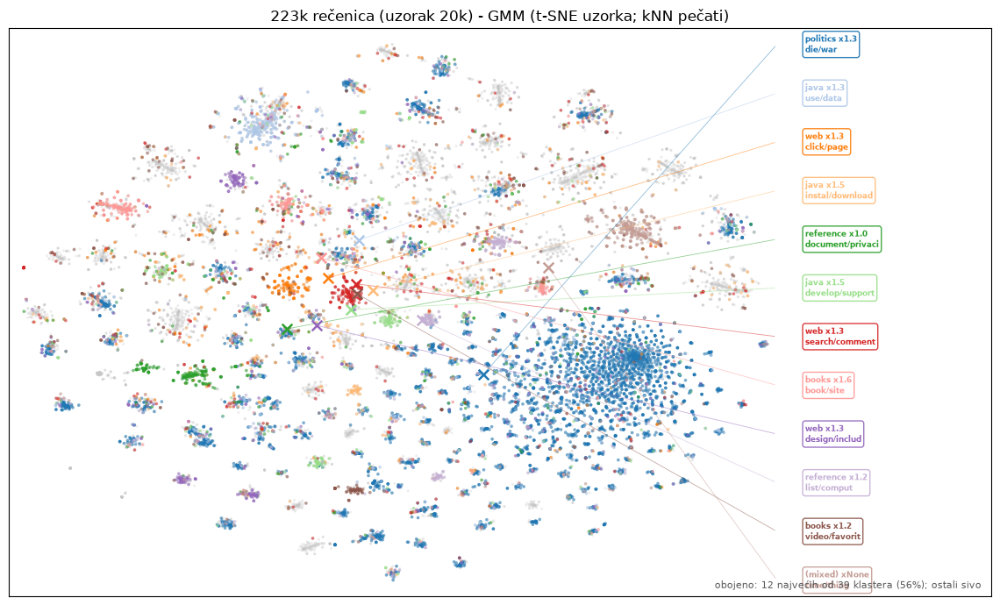

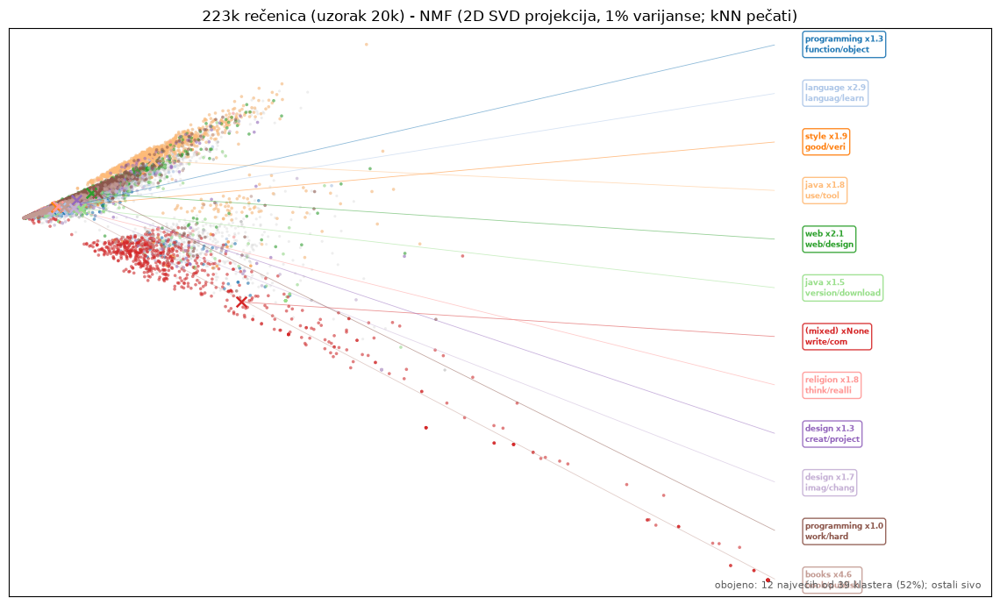

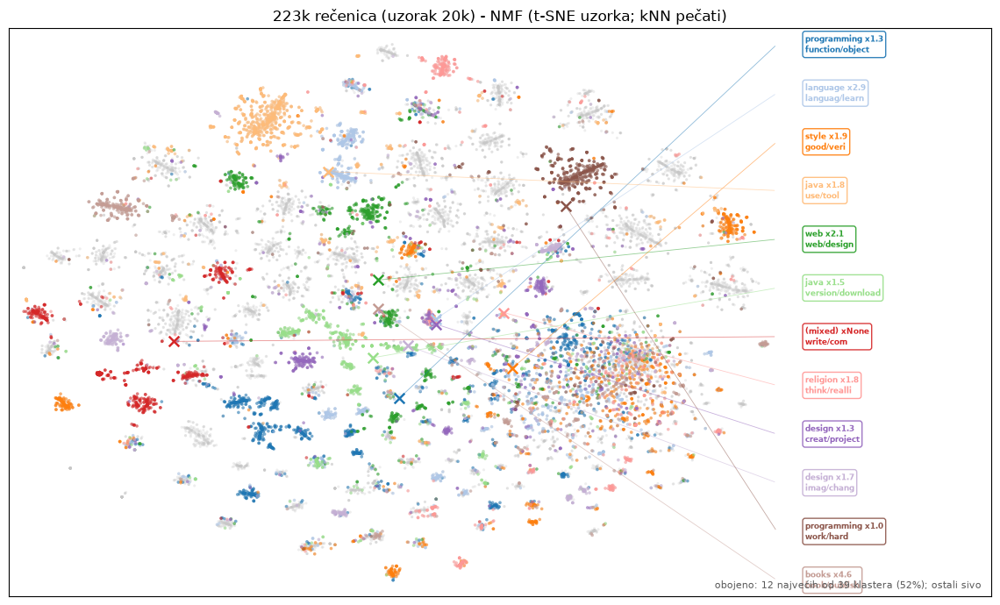

In [37]:
sent_table, sent_labels = sentence_algorithms(S, SENT_K)

### Skan i na k=20 (broj ljudskih klasa)


  [gmm-bic] spherical: -1047228643
  [gmm-bic] diag: -1644520682
  [keš] sent_algorithms_k20.pkl izračunato i sačuvano

--- Rečenice: pet algoritama (k=20), sortirano po čistoći na 1 468 anotiranih ---
        algorithm  coverage  purity_inherited  capture_1468_true  silhouette  sil_w  n_clusters
          K-Means       1.0             0.390              0.250       0.015  0.015          20
              NMF       1.0             0.390              0.249       0.020  0.020          20
              GMM       1.0             0.387              0.230      -0.000 -0.000          20
Bisecting K-Means       1.0             0.385              0.221       0.009  0.009          20


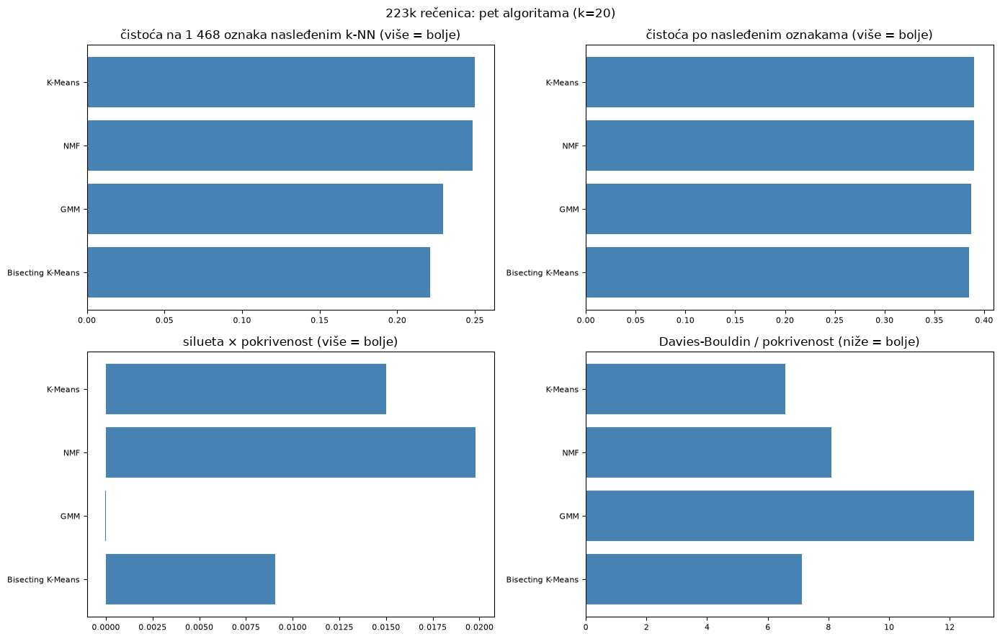

  [pkl] results\sentence_layer_algorithms.pkl

--- Klasteri rečenica (k=20), imenovani iz dva izvora ---
  cl13 (131715) kNN:[politicsx1.3] nasleđe:[religionx1.2]: world, right, valu, year, state
  cl15 ( 12155) kNN:[javax1.8] nasleđe:[javax1.6]: use, term, tool, applic, method
  cl12 (  9209) kNN:[webx1.3] nasleđe:[internetx1.3]: site, know, list, pleas, web
  cl 1 (  7242) kNN:[(mixed)xNone] nasleđe:[stylex1.3]: make, document, substr, frame, parent
  cl 3 (  5714) kNN:[webx1.1] nasleđe:[webx1.2]: work, fine, licens, great, hard
  cl 5 (  5697) kNN:[(mixed)xNone] nasleđe:[stylex1.5]: comment, post, june, pleas, form
  cl18 (  5689) kNN:[webx1.2] nasleđe:[internetx1.1]: new, york, featur, creat, ad
  cl 6 (  5546) kNN:[programmingx1.6] nasleđe:[programmingx1.8]: want, code, sourc, write, don
  cl 0 (  5533) kNN:[designx2.7] nasleđe:[designx1.9]: design, way, web, pattern, best
  cl 8 (  4991) kNN:[webx1.1] nasleđe:[philosophyx1.3]: time, spend, long, wast, real
  cl 9 (  4008) kNN:[we

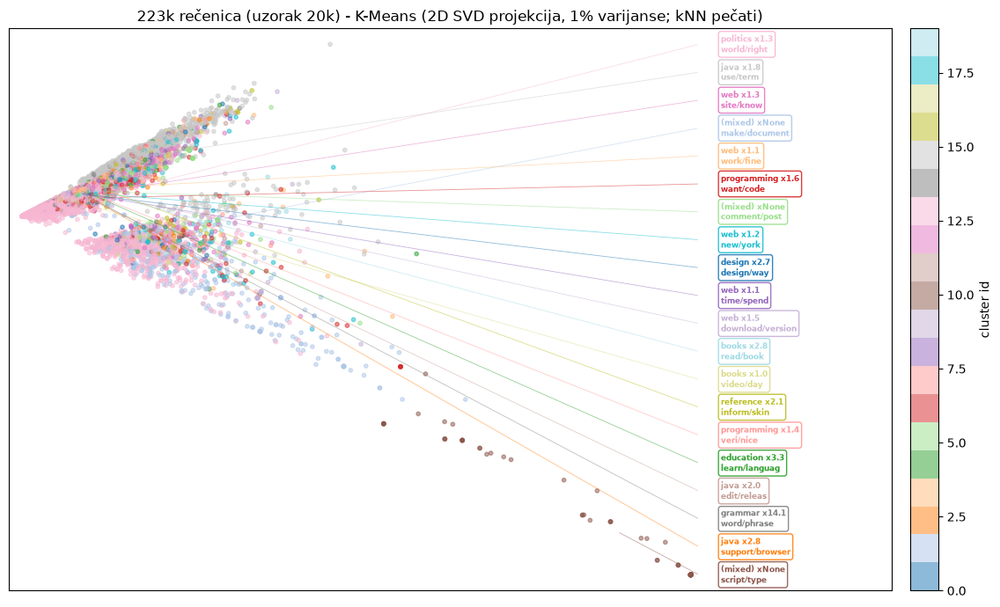

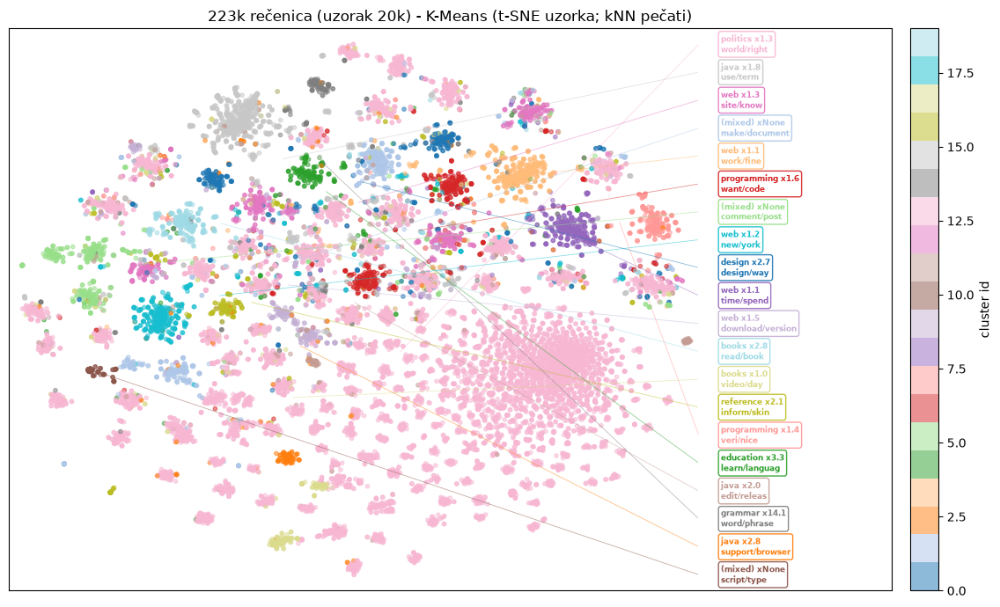

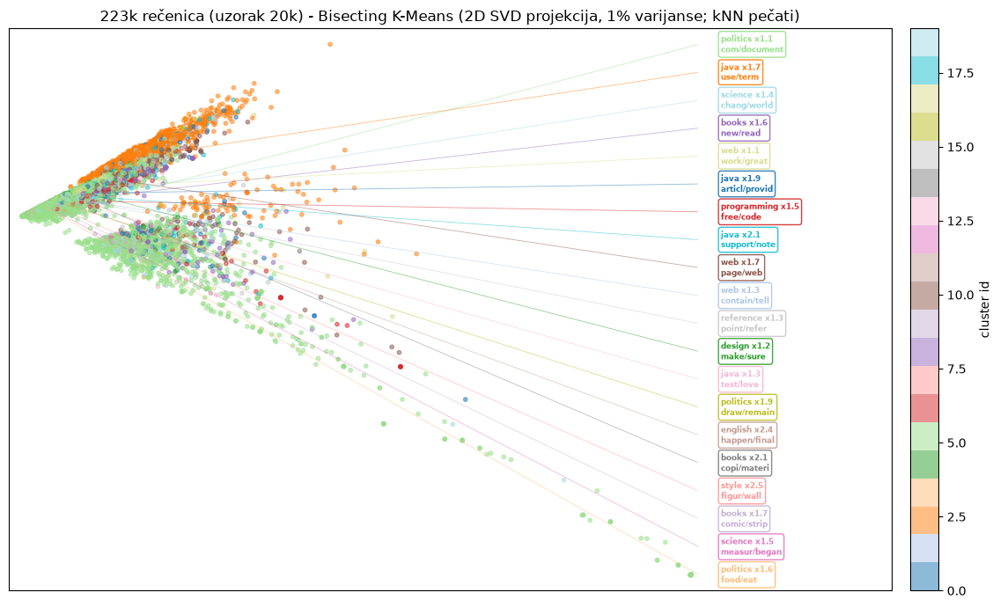

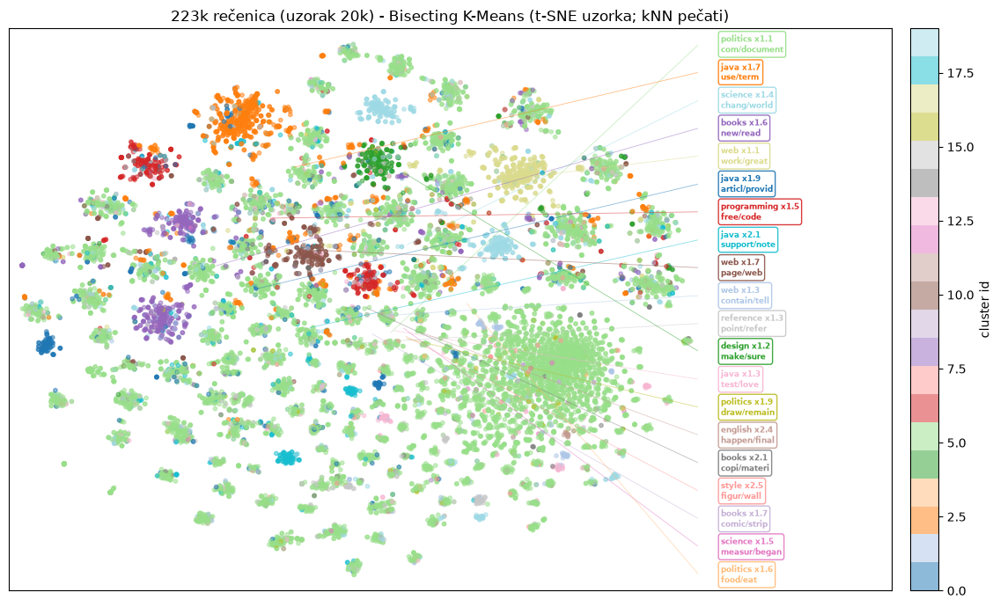

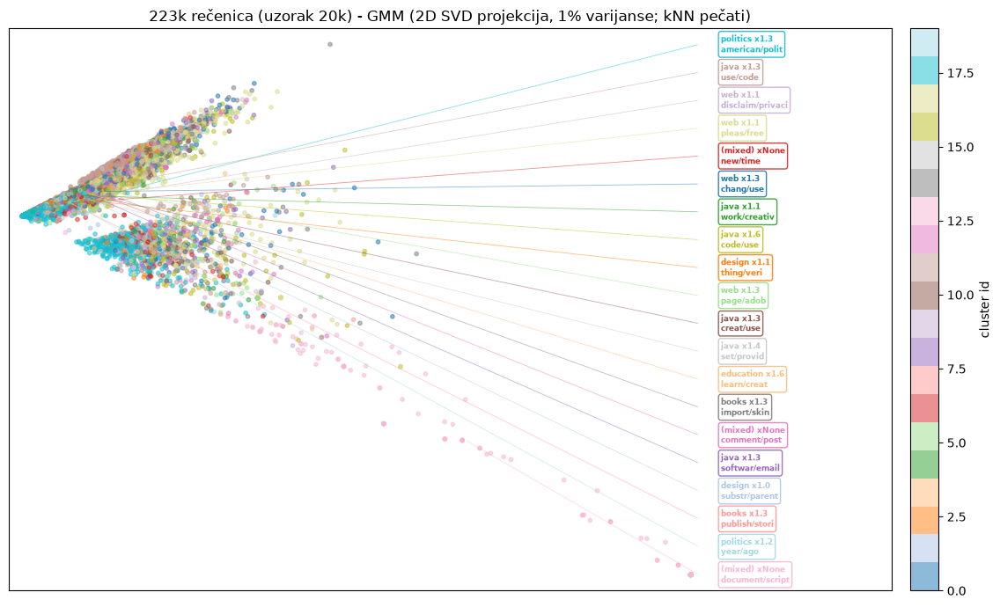

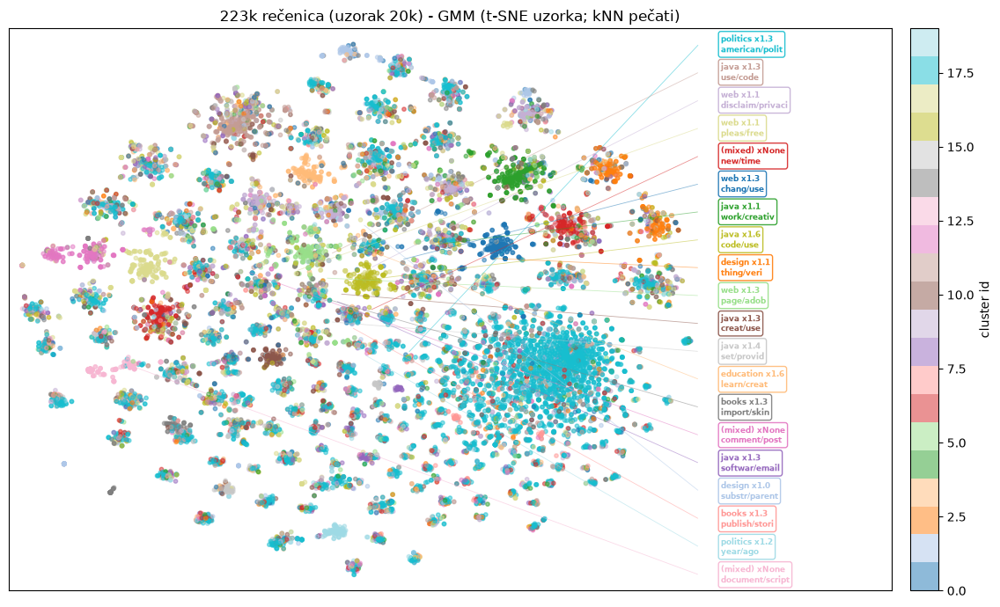

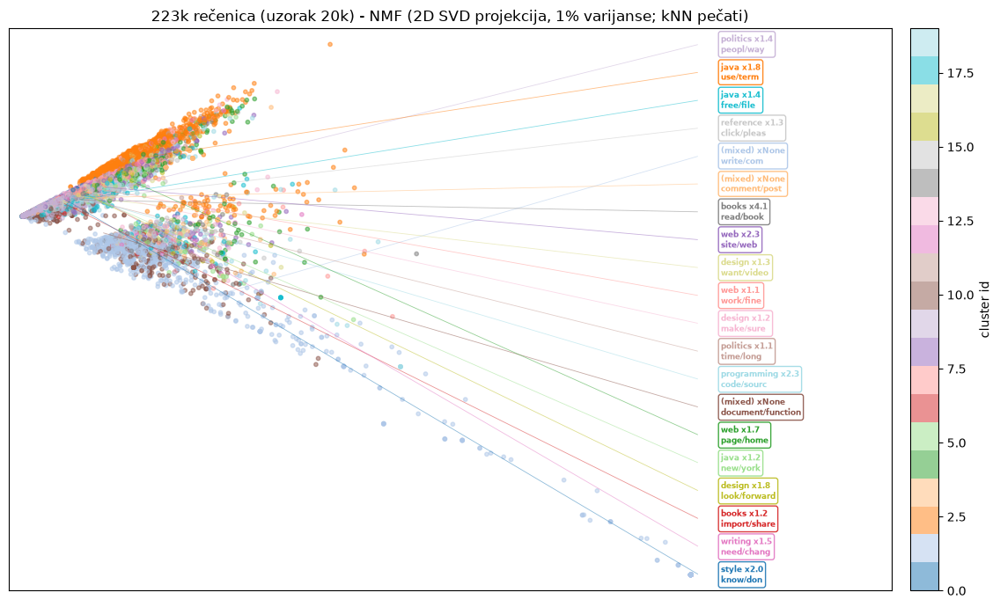

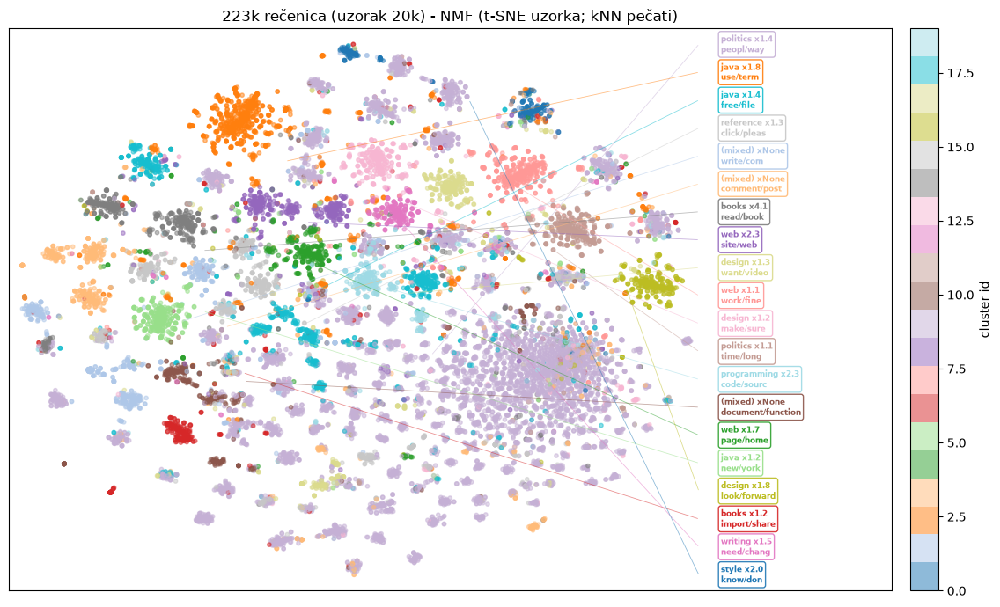

In [38]:
sent_table20, sent_labels20 = sentence_algorithms(S, K_MAIN)

### Hijerarhija mikro-tema rečenica (Ward nad centroidima)


In [39]:
def sentence_hierarchy(S, k_fine=None, cuts=range(3, 11)):
    k_fine = k_fine or SENT_K
    red = S["red"]
    Y = S["Y"].astype(int)

    def _micro():
        log(f"rečenice: mikro-sloj KMeans({k_fine}) + Ward "
            "stablo centroida ...")
        km = KMeans(k_fine, random_state=42, n_init=10).fit(red)
        fine = km.labels_
        fine_words = {c: "/".join(discriminative_words(
            S["tfidf"], S["terms"], np.where(fine == c)[0],
            S["gmean"], n=2)) for c in range(k_fine)}
        return dict(fine=fine, fine_words=fine_words,
                    Z=linkage(km.cluster_centers_, method="ward"))

    d = cached("sent_hierarchy.pkl", _micro)
    fine, Z = d["fine"], d["Z"]
    fine_words = d["fine_words"]
    print("\n--- Rečenice: super-grupe po rezovima "
          "(n | top klasa (lift) | reči) ---")
    for k_cut in cuts:
        grp = fcluster(Z, t=k_cut, criterion="maxclust")
        parts = []
        for g in range(1, k_cut + 1):
            micros = np.where(grp == g)[0]
            if not len(micros):
                continue
            m = np.isin(fine, micros)
            n = int(m.sum())
            lift_c = _class_lift(Y, m)
            order = [j for j in np.argsort(lift_c)[::-1]
                     if np.isfinite(lift_c[j])]
            top = (f"{CLASS_NAMES[order[0]]}({lift_c[order[0]]:.1f})"
                   if order else "?")
            words = ", ".join(discriminative_words(
                S["tfidf"], S["terms"], np.where(m)[0],
                S["gmean"], n=3))
            parts.append(f"({n}s {top} | {words})")
        print(f"  k={k_cut:>2}: " + " ".join(parts))
    for k_cut in cuts:
        cut_height = sorted(Z[:, 2], reverse=True)[k_cut - 1]
        fig, ax = plt.subplots(figsize=(24, 9))
        dendrogram(Z, labels=[fine_words[c]
                               for c in range(k_fine)],
                   leaf_rotation=90, leaf_font_size=7, ax=ax,
                   color_threshold=cut_height * 1.001)
        ax.axhline(cut_height, color="red", ls="--", alpha=0.7)
        ax.set_title(f"Hijerarhija mikro-tema rečenica "
                     f"(K-Means {k_fine} → Ward), "
                     f"rez na {k_cut} super-grupa")
        fig.tight_layout()
        show_fig(f"sent_dendro{k_fine}_cut{k_cut}.png")
    return d


[02:15:39] rečenice: mikro-sloj KMeans(39) + Ward stablo centroida ...
  [keš] sent_hierarchy.pkl izračunato i sačuvano

--- Rečenice: super-grupe po rezovima (n | top klasa (lift) | reči) ---
  k= 3: (222357s web(1.0) | use, work, new) (486s education(2.1) | substr, frame, parent) (445s philosophy(2.7) | skin, import, main)
  k= 4: (221395s programming(1.0) | use, work, new) (962s style(1.3) | script, type, text) (486s education(2.1) | substr, frame, parent) (445s philosophy(2.7) | skin, import, main)
  k= 5: (220478s politics(1.0) | use, work, post) (917s style(1.7) | size, font, imag) (962s style(1.3) | script, type, text) (486s education(2.1) | substr, frame, parent) (445s philosophy(2.7) | skin, import, main)
  k= 6: (218689s politics(1.0) | comment, post, book) (1789s computer(2.1) | instal, download, flash) (917s style(1.7) | size, font, imag) (962s style(1.3) | script, type, text) (486s education(2.1) | substr, frame, parent) (445s philosophy(2.7) | skin, import, main)
  k= 7: 

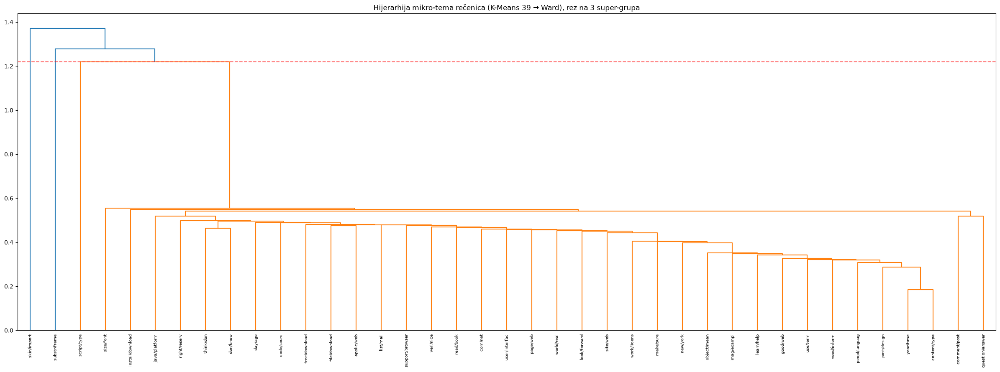

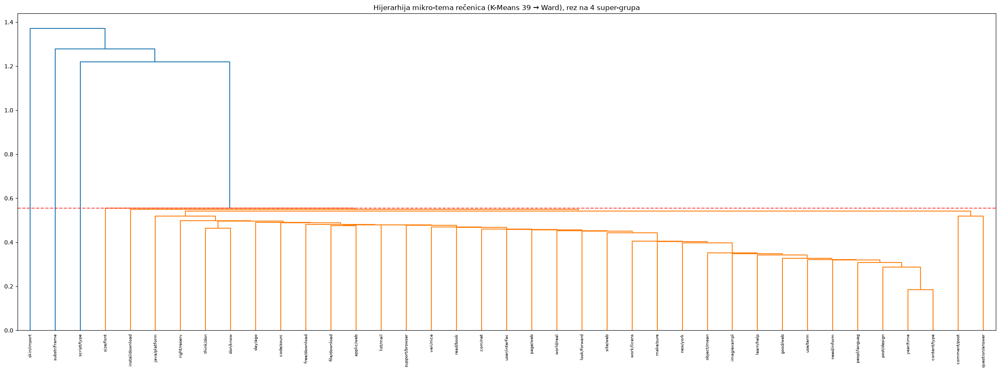

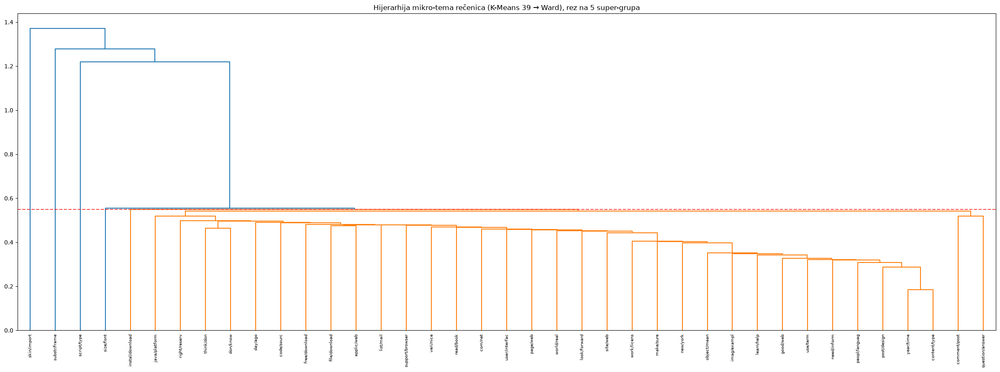

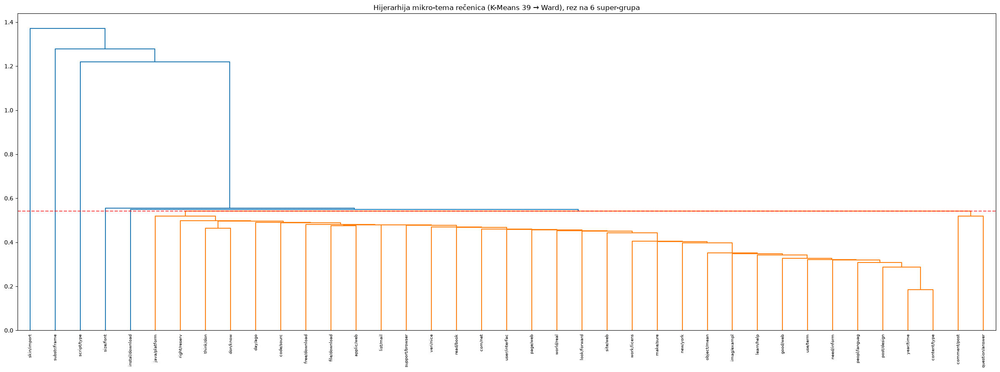

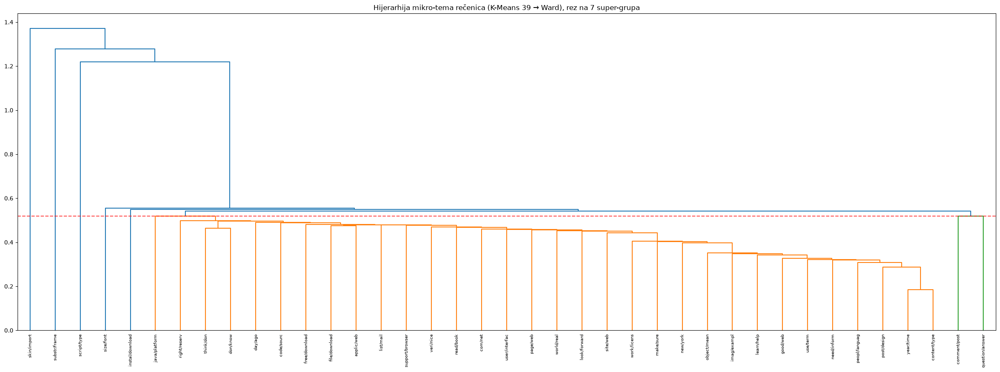

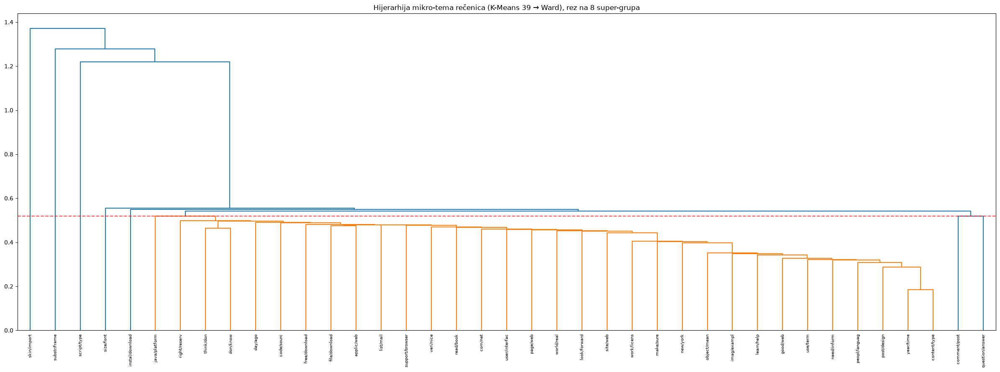

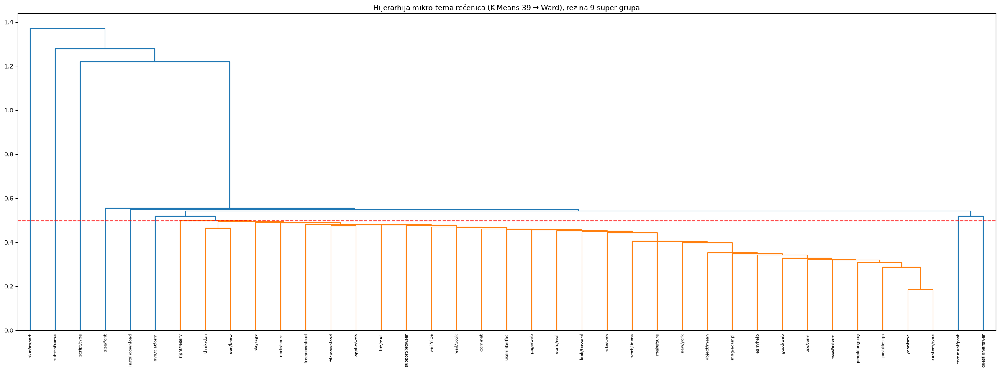

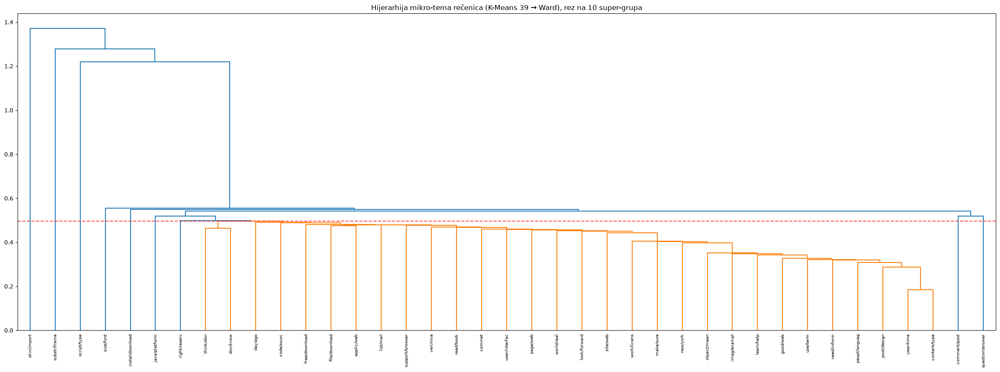

In [40]:
sent_hierarchy_out = sentence_hierarchy(S)
